In [2]:
# enable automatic reloading of the notebook
%load_ext autoreload
%autoreload 2

# Data Analysis
This notebook contains the scripts used for analyzing the retrieved data.

## Load Dataset

Loads the dataset, counts the number of articles loaded, and converts the
list of json objects into a Python Pandas Data Frame.

In [3]:
# import the dataset loader
from src.data.dataset import load_dataset

In [4]:
# load the raw articles
dataset = load_dataset()

## Dataset Statistics

Dataset statistics will provide insight into what type of articles 
did we collect. To best simulate the real-world scenario, we must
first find the articles distribution per 

- datetime
- language
- events

In order to do so, here is a list of tasks we need to perform.

- **Datetime distribution.** Create a histogram or line chart with the
  datetime on the x-axis and the article count on the y-axis.
- **Language distribution.** Create a bar chart showing the article's
  distribution by language.
- **Language coocurrence.** Create a heatmap showing in which languages
  are the events most commonly reported in (based on the `eventUri` 
  attribute).
- **Number of duplicates.** Get the number of article duplicates in the
  data set.

In addition, we are interested in the above distributions for each 
group of articles, where a group of articles is defined as the articles
that contain the same `concept` values.
    

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy
import seaborn as sns

In [6]:
data_frame = pd.DataFrame(dataset)
data_frame

,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,url,...,body,source,authors,image,eventUri,sentiment,wgt,relevance,concepts,userHasPermissions
0,1395062594,eng,False,2020-01-01,00:01:00,2020-01-01 00:01:00,2020-01-01 00:01:00,news,0.000000,https://www.bostonglobe.com/sports/2019/12/31/...,...,The Bruins exceeded expectations and came tant...,"{'uri': 'bostonglobe.com', 'dataType': 'news',...",[],https://bostonglobe-prod.cdn.arcpublishing.com...,None,0.152941,315532860,39,"[basketball, nba]",NaN
1,1395062266,eng,False,2020-01-01,00:01:00,2020-01-01 00:01:00,2019-12-31 23:58:00,news,0.537255,https://spokesman-recorder.com/2019/12/31/this...,...,Last column of the year for 2019 and first for...,"{'uri': 'spokesman-recorder.com', 'dataType': ...",[{'uri': 'larry_fitzgerald@spokesman-recorder....,None,eng-5386095,-0.035294,315532860,51,"[basketball, nba]",NaN
2,1395062279,jpn,False,2020-01-01,00:01:00,2020-01-01 00:01:00,2020-01-01 00:00:00,news,0.000000,https://www.afpbb.com/articles/-/3261805,...,【1月1日 AFP】2020年の幕開けとなった1日、世界各地で新年を祝う催しが行われたが、一...,"{'uri': 'afpbb.com', 'dataType': 'news', 'titl...",[],https://afpbb.ismcdn.jp/mwimgs/e/9/1000x/img_e...,None,NaN,315532860,100,"[hong_kong, demonstration]",NaN
3,1395063212,spa,False,2020-01-01,00:02:00,2020-01-01 00:02:00,2020-01-01 00:02:00,news,0.000000,https://libero.pe/deportes/basquet/1528528-leb...,...,El actual alero de los Lakers derrotó en las v...,"{'uri': 'libero.pe', 'dataType': 'news', 'titl...",[],https://prod.media.libero.pe/1200x660/libero/i...,None,NaN,315532920,39,"[basketball, nba]",NaN
4,1395063053,eng,False,2020-01-01,00:02:00,2020-01-01 00:02:00,2020-01-01 00:01:00,news,0.435294,https://www.dkpittsburghsports.com/2019/12/31/...,...,"ROCHESTER, N.Y. -- Hot Button is a 'round-the-...","{'uri': 'dkpittsburghsports.com', 'dataType': ...",[{'uri': 'bob_maddamma@dkpittsburghsports.com'...,https://s3.amazonaws.com/dksports-uploads/uplo...,eng-5388538,0.082353,315532920,14,"[basketball, nba]",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1791338,6859607219,eng,False,2021-12-22,16:56:00,2021-12-22 16:56:00,2021-12-22 16:00:00,news,0.000000,https://www.algemeiner.com/2021/12/22/gripping...,...,He would walk into a room with a mob boss. He ...,"{'uri': 'algemeiner.com', 'dataType': 'news', ...",[],https://www.algemeiner.com/wp-content/uploads/...,None,-0.066667,377888160,67,"[vienna, _austria, _terrorism]",NaN
1791339,6859645112,eng,False,2021-12-22,17:29:00,2021-12-22 17:29:00,2021-12-22 17:13:00,news,0.678431,https://zehabesha.com/prochazkas-ghost-in-the-...,...,"""The numerous tribes who inhabit the Ethiopian...","{'uri': 'zehabesha.com', 'dataType': 'news', '...",[],https://zehabesha.com/wp-admin/admin-ajax.php?...,eng-7360161,-0.050980,377890140,67,"[vienna, _austria, _terrorism]",NaN
1791340,6860294180,eng,False,2021-12-23,07:16:00,2021-12-23 07:16:00,2021-12-23 07:00:00,news,0.000000,https://www.euronews.com/culture/2021/12/23/th...,...,"In this review, we look back at some of the mo...","{'uri': 'euronews.com', 'dataType': 'news', 't...",[],https://static.euronews.com/articles/stories/0...,None,0.129412,377939760,59,"[eurovision_song_contest, _rotterdam, _netherl...",NaN
1791341,6863016190,eng,False,2021-12-25,16:17:00,2021-12-25 16:17:00,2021-12-25 16:17:00,news,0.000000,https://www.eadt.co.uk/things-to-do/east-angli...,...,1 Which Suffolk village sign depicts a 12th ce...,"{'uri': 'eadt.co.uk', 'dataType': 'news', 'tit...",[],https://images.cm.archant.co.uk/service/social...,None,0.098039,378145020,34,"[eurovision_song_contest, _rotterdam, _netherl...",NaN


Data frame preparation concept list from list to string

In [7]:
def concatenate(concept_list):
    for i in range(len(concept_list)):
        concept_list[i] = ', '.join(concept_list[i])
    return concept_list

def concatenate_df(concept_list):
    concept_list = ', '.join(concept_list)
    return concept_list

In [8]:
data_frame_tmp = data_frame.copy()
date_frame_wstr_concepts_tmp = data_frame_tmp['concepts'].apply(concatenate_df)
date_frame_wstr_concepts = data_frame.copy()
date_frame_wstr_concepts['concepts'] = date_frame_wstr_concepts_tmp
date_frame_wstr_concepts

,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,url,...,body,source,authors,image,eventUri,sentiment,wgt,relevance,concepts,userHasPermissions
0,1395062594,eng,False,2020-01-01,00:01:00,2020-01-01 00:01:00,2020-01-01 00:01:00,news,0.000000,https://www.bostonglobe.com/sports/2019/12/31/...,...,The Bruins exceeded expectations and came tant...,"{'uri': 'bostonglobe.com', 'dataType': 'news',...",[],https://bostonglobe-prod.cdn.arcpublishing.com...,None,0.152941,315532860,39,"basketball, nba",NaN
1,1395062266,eng,False,2020-01-01,00:01:00,2020-01-01 00:01:00,2019-12-31 23:58:00,news,0.537255,https://spokesman-recorder.com/2019/12/31/this...,...,Last column of the year for 2019 and first for...,"{'uri': 'spokesman-recorder.com', 'dataType': ...",[{'uri': 'larry_fitzgerald@spokesman-recorder....,None,eng-5386095,-0.035294,315532860,51,"basketball, nba",NaN
2,1395062279,jpn,False,2020-01-01,00:01:00,2020-01-01 00:01:00,2020-01-01 00:00:00,news,0.000000,https://www.afpbb.com/articles/-/3261805,...,【1月1日 AFP】2020年の幕開けとなった1日、世界各地で新年を祝う催しが行われたが、一...,"{'uri': 'afpbb.com', 'dataType': 'news', 'titl...",[],https://afpbb.ismcdn.jp/mwimgs/e/9/1000x/img_e...,None,NaN,315532860,100,"hong_kong, demonstration",NaN
3,1395063212,spa,False,2020-01-01,00:02:00,2020-01-01 00:02:00,2020-01-01 00:02:00,news,0.000000,https://libero.pe/deportes/basquet/1528528-leb...,...,El actual alero de los Lakers derrotó en las v...,"{'uri': 'libero.pe', 'dataType': 'news', 'titl...",[],https://prod.media.libero.pe/1200x660/libero/i...,None,NaN,315532920,39,"basketball, nba",NaN
4,1395063053,eng,False,2020-01-01,00:02:00,2020-01-01 00:02:00,2020-01-01 00:01:00,news,0.435294,https://www.dkpittsburghsports.com/2019/12/31/...,...,"ROCHESTER, N.Y. -- Hot Button is a 'round-the-...","{'uri': 'dkpittsburghsports.com', 'dataType': ...",[{'uri': 'bob_maddamma@dkpittsburghsports.com'...,https://s3.amazonaws.com/dksports-uploads/uplo...,eng-5388538,0.082353,315532920,14,"basketball, nba",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1791338,6859607219,eng,False,2021-12-22,16:56:00,2021-12-22 16:56:00,2021-12-22 16:00:00,news,0.000000,https://www.algemeiner.com/2021/12/22/gripping...,...,He would walk into a room with a mob boss. He ...,"{'uri': 'algemeiner.com', 'dataType': 'news', ...",[],https://www.algemeiner.com/wp-content/uploads/...,None,-0.066667,377888160,67,"vienna, _austria, _terrorism",NaN
1791339,6859645112,eng,False,2021-12-22,17:29:00,2021-12-22 17:29:00,2021-12-22 17:13:00,news,0.678431,https://zehabesha.com/prochazkas-ghost-in-the-...,...,"""The numerous tribes who inhabit the Ethiopian...","{'uri': 'zehabesha.com', 'dataType': 'news', '...",[],https://zehabesha.com/wp-admin/admin-ajax.php?...,eng-7360161,-0.050980,377890140,67,"vienna, _austria, _terrorism",NaN
1791340,6860294180,eng,False,2021-12-23,07:16:00,2021-12-23 07:16:00,2021-12-23 07:00:00,news,0.000000,https://www.euronews.com/culture/2021/12/23/th...,...,"In this review, we look back at some of the mo...","{'uri': 'euronews.com', 'dataType': 'news', 't...",[],https://static.euronews.com/articles/stories/0...,None,0.129412,377939760,59,"eurovision_song_contest, _rotterdam, _netherlands",NaN
1791341,6863016190,eng,False,2021-12-25,16:17:00,2021-12-25 16:17:00,2021-12-25 16:17:00,news,0.000000,https://www.eadt.co.uk/things-to-do/east-angli...,...,1 Which Suffolk village sign depicts a 12th ce...,"{'uri': 'eadt.co.uk', 'dataType': 'news', 'tit...",[],https://images.cm.archant.co.uk/service/social...,None,0.098039,378145020,34,"eurovision_song_contest, _rotterdam, _netherlands",NaN


Data frame properties

In [8]:
data_frame.shape
data_frame.describe()
data_frame.dtypes

uri                           object
lang                          object
isDuplicate                     bool
date                  datetime64[ns]
time                          object
dateTime              datetime64[ns]
dateTimePub           datetime64[ns]
dataType                      object
sim                          float64
url                           object
title                         object
body                          object
source                        object
authors                       object
image                         object
eventUri                      object
sentiment                    float64
wgt                            int64
relevance                      int64
concepts                      object
userHasPermissions            object
dtype: object

Histogram function

In [83]:
def hist_plot(data_frame: pd.core.frame.DataFrame=data_frame, column: str = 'date', by: str = None, bins: int = 243, 
              title: str='Number of Articles by Date Time' , x_label_name: str='article count', y_label_name: str='date time', 
              fig_size: tuple = (24,8), color: str  = '#fc034e', lines: bool=True, legend: bool=False):
    
    ' ' 'This function plots a histogram of a data frame' ' '
    
    histogram = data_frame.hist(column=column, grid=False, figsize=fig_size, rwidth=0.8, bins=bins, legend=legend, color=color, by=by)

    hist_atributes = histogram[0]
    
    #print(hist_atributes)
    
    for atributes in hist_atributes:
    
        # Despine
        atributes.spines['right'].set_visible(False)
        atributes.spines['top'].set_visible(False)
        #atributes.spines['left'].set_visible(False)
    
        # Switch off ticks
        atributes.tick_params(axis="both", which="both", bottom="off", labelbottom="on", left="off", right="off", labelleft="on")
        
        
        # Draw horizontal axis lines
        vals = atributes.get_yticks()
        for tick in vals:
            atributes.axhline(y=tick, linestyle='dashed', alpha=0.1, color='#000000', zorder=1)
        
        # Remove title
        atributes.set_title(title, weight='bold', size=16)

        # Set x-axis label
        atributes.set_xlabel(x_label_name, labelpad=20, weight='bold', size=12)

        # Set y-axis label
        atributes.set_ylabel(y_label_name, labelpad=20, weight='bold', size=12)
        
    plt.show()

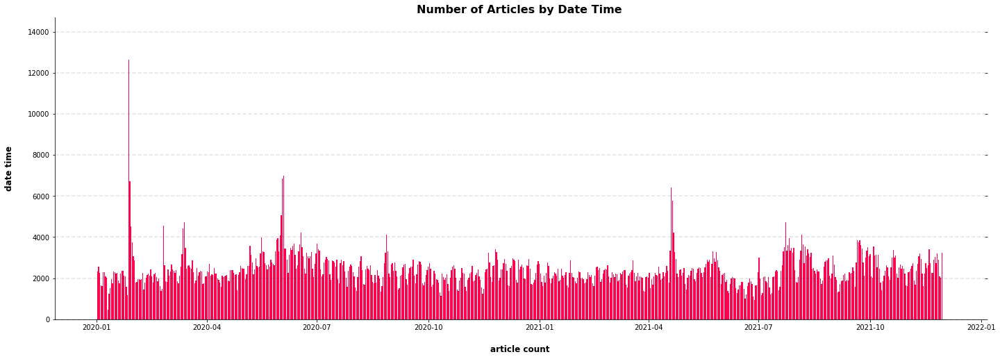

In [11]:
#per day
hist_plot(bins=731)

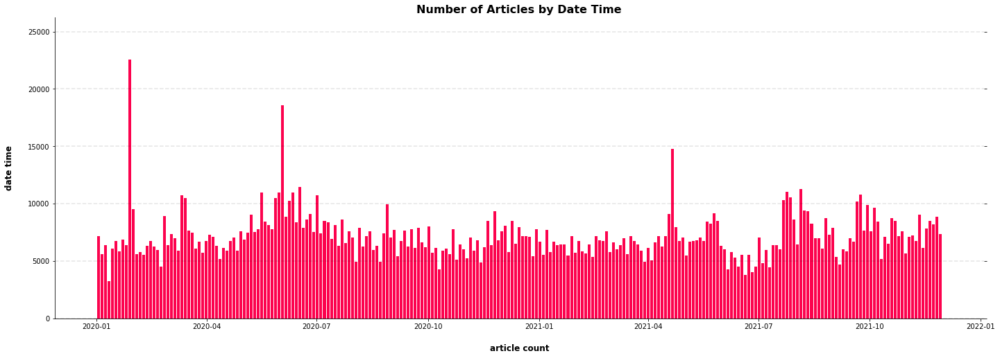

In [14]:
#per 3 days
hist_plot()

Bar chart function

In [15]:
def bar_plot(data_frame: pd.core.frame.DataFrame=data_frame, column: str = 'lang', color: str  = '#fc034e', fig_size: tuple=(14, 8), title='Language distribution'):
    
    ' ' 'This function plots a bar chart of a data frame.' ' '
    
    value_counts = data_frame[column].value_counts()
    
    bar_chart = value_counts.plot.bar(color=color, figsize=fig_size, title=title)
    plt.show()

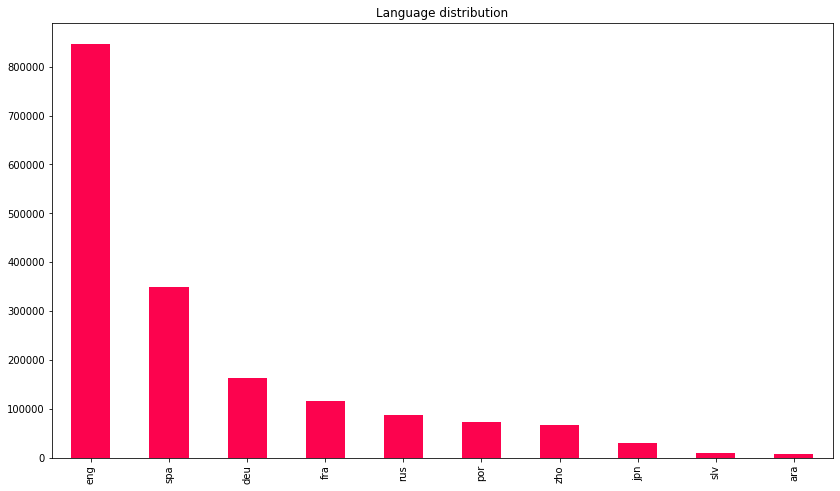

In [16]:
bar_plot()

<AxesSubplot:>

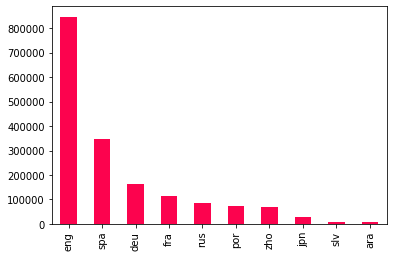

In [17]:
lang_dict = data_frame['lang'].value_counts()
lang_dict.plot.bar(color='#fc034e')

Finding duplicates function

In [10]:
def duplicates(data_frame: pd.core.frame.DataFrame=data_frame):
    ' ' ' This function returnns list of duplicates based on isDuplicate attribute' ' '
    
    duplicate_list = []
    for article in data_frame['isDuplicate']:
        if article:
            duplicate_list.append(article)

    return len(duplicate_list)

In [11]:
duplicates()

0

Finding duplicates with duplicated bodies

In [12]:
duplicates(data_frame)

duplicates_df = data_frame[data_frame.duplicated(subset=['body'], keep=False)]
duplicates_df

#duplicates_df = duplicates_df.drop_duplicates(subset=['body'], keep=False)
duplicates_df

,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,url,...,body,source,authors,image,eventUri,sentiment,wgt,relevance,concepts,userHasPermissions
8,1395064125,eng,False,2020-01-01,00:03:00,2020-01-01 00:03:00,2020-01-01 00:03:00,news,0.000000,https://www.malverngazette.co.uk/uk_national_s...,...,Dean Smith has seen Aston Villa lose five of t...,"{'uri': 'malverngazette.co.uk', 'dataType': 'n...",[],https://www.malverngazette.co.uk/resources/ima...,None,-0.145098,315532980,63,"[association_football, premier_league]",NaN
17,1395067127,eng,False,2020-01-01,00:08:00,2020-01-01 00:08:00,2020-01-01 00:07:00,news,0.000000,https://www.halesowennews.co.uk/uk_national_sp...,...,Dean Smith has seen Aston Villa lose five of t...,"{'uri': 'halesowennews.co.uk', 'dataType': 'ne...",[],https://www.halesowennews.co.uk/resources/imag...,None,-0.145098,315533280,63,"[association_football, premier_league]",NaN
19,1395067374,eng,False,2020-01-01,00:10:00,2020-01-01 00:10:00,2019-12-31 23:05:00,news,0.000000,https://www.dw.com/en/croatias-eu-presidency-w...,...,Croatia is not stinting on the superlatives wh...,"{'uri': 'dw.com', 'dataType': 'news', 'title':...",[],https://www.dw.com/image/16773571_401.jpg,None,0.215686,315533400,51,[european_migrant_crisis],NaN
22,1395067374,eng,False,2020-01-01,00:10:00,2020-01-01 00:10:00,2019-12-31 23:05:00,news,0.000000,https://www.dw.com/en/croatias-eu-presidency-w...,...,Croatia is not stinting on the superlatives wh...,"{'uri': 'dw.com', 'dataType': 'news', 'title':...",[],https://www.dw.com/image/16773571_401.jpg,None,0.215686,315533400,100,[presidency_of_the_council_of_the_european_union],NaN
31,1395072192,eng,False,2020-01-01,00:18:00,2020-01-01 00:18:00,2020-01-01 00:17:00,news,0.000000,https://www.redditchadvertiser.co.uk/uk_nation...,...,Dean Smith has seen Aston Villa lose five of t...,"{'uri': 'redditchadvertiser.co.uk', 'dataType'...",[],https://www.redditchadvertiser.co.uk/resources...,None,-0.145098,315533880,63,"[association_football, premier_league]",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1791216,6829712209,rus,False,2021-11-29,23:12:00,2021-11-29 23:12:00,2021-11-29 23:08:00,news,0.000000,https://www.championat.com/football/news-45290...,...,"Экс-защитник ""Манчестер Юнайтед"" Пол Паркер об...","{'uri': 'championat.com', 'dataType': 'news', ...","[{'uri': 'вячеслав_моренко@championat.com', 'n...",https://img.championat.com/news2/social/5/c5/4...,None,NaN,375923520,51,"[association_football, premier_league]",NaN
1791217,6829713763,eng,False,2021-11-29,23:14:00,2021-11-29 23:14:00,2021-11-29 21:23:00,news,0.760784,https://www.theday.com/article/20211129/SPORT1...,...,Paris -- Lionel Messi won the men's Ballon d'O...,"{'uri': 'theday.com', 'dataType': 'news', 'tit...",[],https://www.theday.com/storyimage/NL/20211129/...,spa-2577140,0.560784,375923640,14,"[association_football, la_liga]",NaN
1791219,6829713763,eng,False,2021-11-29,23:14:00,2021-11-29 23:14:00,2021-11-29 21:23:00,news,0.760784,https://www.theday.com/article/20211129/SPORT1...,...,Paris -- Lionel Messi won the men's Ballon d'O...,"{'uri': 'theday.com', 'dataType': 'news', 'tit...",[],https://www.theday.com/storyimage/NL/20211129/...,spa-2577140,0.560784,375923640,38,"[association_football, bundesliga]",NaN
1791223,6829714392,spa,False,2021-11-29,23:16:00,2021-11-29 23:16:00,2021-11-29 23:15:00,news,0.509804,http://www.elnuevodia.com.co/nuevodia/deportes...,...,El argentino Leo Messi ha conquistado este lun...,"{'uri': 'elnuevodia.com.co', 'dataType': 'news...",[],http://www.elnuevodia.com.co/nuevodia/sites/de...,spa-2575437,NaN,375923760,76,"[association_football, la_liga]",NaN


Function making a language coocurrence matrix of data frame

In [25]:
def lang_coocurrence_mx(data_frame: pd.core.frame.DataFrame=data_frame, relative: bool=True, coocur: bool = True, index_list: list=['eng', 'spa', 'fra', 'deu', 'rus', 'por', 'zho', 'jpn', 'slv', 'ara'], accuracy: int=10000):
    ' ' 'Returns language coocurrence matrix of data frame' ' '
    #Preparation for coocurrence of languages
    
    # blank coocurrence matrix
    language_coocurrence_matrix = [[0 for i in range(10)] for i in range(10)]
    
    #index_list selection guide
    ##index_lst = ['fra', 'deu', 'por', 'eng', 'rus', 'spa', 'zho', 'slv', 'jpn', 'ara']<--this gives you in order of most coocured articles 
    ##OR USE THIS: sorted(list(set(data_frame['lang'].values))) OR ['eng', 'spa', 'fra', 'deu', 'rus', 'por', 'zho', 'jpn', 'slv', 'ara']<-- this gives you in order of bigest coun
    
    #data frame without None eventUri values
    language_eventUri_df = data_frame[['eventUri', 'lang']].query('eventUri == eventUri')

    #data frame cleanup(drop duplicates, drop eventUri events with only one language)
    language_eventUri_df = language_eventUri_df .drop_duplicates(subset=['eventUri', 'lang'], keep='first')
    
    event_uri_ID_df = language_eventUri_df['eventUri'].apply(lambda x : int(x[4:]))
    language_eventUri_df['eventUriID'] = event_uri_ID_df
    
    #data frame sorted by eventUri
    language_eventUri_df = language_eventUri_df.sort_values(by='eventUriID').reset_index(drop=True)
    
    #Extensions:
    if coocur: language_eventUri_df  = language_eventUri_df [language_eventUri_df.duplicated(subset=['eventUri'], keep=False)] #<-- drops rows which don't coocur with other languages

    #list of unique eventUri
    event_uri_list = language_eventUri_df ['eventUri'].unique()

    #-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
    
    #OLD ALGORITHM
    ##coocurrence search(making of coocurrence matrix)
    #for  event in event_uri_list:
    #   #list of language coocurrence
    #    language_list = language_eventUri_df .loc[language_eventUri_df['eventUri'] == event]['lang'].unique()
    #    #language coocurrence matrix fillup 
    #    for language1 in language_list:
    #        for language2 in language_list:
    #            language_coocurrence_matrix[index_list.index(language1)][index_list.index(language2)] += 1
    
    #NEW ALGORITHM
    
    language_list = []
    evUri = '\0'
    for index, row in language_eventUri_df.iterrows():
        if row['eventUri'] == evUri:
            language_list.append(row['lang'])
        else:
            for language1 in language_list:
                for language2 in language_list:
                    language_coocurrence_matrix[index_list.index(language1)][index_list.index(language2)] += 1
            language_list.clear()
            evUri = row['eventUri']
            language_list.append(row['lang'])
    
    #post-processing
    if relative:
        language_coocurrence_corelation_matrix = copy.deepcopy(language_coocurrence_matrix)
        diagonal_values = index_list.copy()

        for index in range(len(language_coocurrence_corelation_matrix)):
            diagonal_values[index] = (language_coocurrence_corelation_matrix[index][index] if language_coocurrence_corelation_matrix[index][index] != 0 else 1)

        for row in range(len(language_coocurrence_corelation_matrix)):
            for column in range(len(language_coocurrence_corelation_matrix[row])):
                if row == column: language_coocurrence_corelation_matrix[row][column] = float(language_coocurrence_corelation_matrix[row][column] / diagonal_values[row])
                if row < column: language_coocurrence_corelation_matrix[row][column] = float(language_coocurrence_corelation_matrix[row][column] / diagonal_values[row])
                if row > column: language_coocurrence_corelation_matrix[row][column] = float(language_coocurrence_corelation_matrix[row][column] / diagonal_values[column])

        #make language_coocurrence_corelation_matrix accurate enough
        for row in range(len(language_coocurrence_corelation_matrix)):
            for number in range(len(language_coocurrence_corelation_matrix[row])):
                language_coocurrence_corelation_matrix[row][number] = float(int(language_coocurrence_corelation_matrix[row][number]  * accuracy)/accuracy)
        return language_coocurrence_corelation_matrix
    else: return language_coocurrence_matrix

In [26]:
lang_coocurrence_mx()

[[1.0, 0.324, 0.3966, 0.3966, 0.2513, 0.2402, 0.1173, 0.0055, 0.0111, 0.0],
 [0.324, 1.0, 0.41, 0.2949, 0.2733, 0.3093, 0.1151, 0.0, 0.0215, 0.0],
 [0.3966, 0.41, 1.0, 0.3221, 0.3028, 0.3798, 0.1057, 0.0, 0.0673, 0.0],
 [0.3966, 0.2949, 0.3221, 1.0, 0.2659, 0.3031, 0.0851, 0.0, 0.0372, 0.0],
 [0.2513, 0.2733, 0.3028, 0.2659, 1.0, 0.4166, 0.0535, 0.0, 0.0595, 0.0],
 [0.2402, 0.3093, 0.3798, 0.3031, 0.4166, 1.0, 0.0641, 0.0, 0.0802, 0.0],
 [0.1173, 0.1151, 0.1057, 0.0851, 0.0535, 0.0641, 1.0, 0.0, 0.074, 0.0],
 [0.0055, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0],
 [0.0111, 0.0215, 0.0673, 0.0372, 0.0595, 0.0802, 0.074, 0.0, 1.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]

In [30]:
#language coocurrence test
data_frame.loc[data_frame['eventUri'] == 'ara-1153964']['lang'].unique()
#arabic articles? (it apprars like they do not coocure with any language) Japan also looks SUS
ara_articles = data_frame.loc[data_frame['lang'] == 'ara']
#ara_articles = ara_articles.drop_duplicates(subset=['eventUri', 'lang'], keep='first')
ara_articles

,uri,lang,isDuplicate,date,time,dateTime,dateTimePub,dataType,sim,url,...,body,source,authors,image,eventUri,sentiment,wgt,relevance,concepts,userHasPermissions
344,1395219688,ara,False,2020-01-01,05:48:00,2020-01-01 05:48:00,2020-01-01 05:48:00,news,0.960784,https://www.skynewsarabia.com/sport/1309313-ال...,...,وأظهر الفيديو نيمار المتواجد في البرازيل خلال ...,"{'uri': 'skynewsarabia.com', 'dataType': 'news...",[],https://www.skynewsarabia.com/images/v1/2020/0...,ara-651231,NaN,315553680,39,"association_football, la_liga",NaN
381,1395236372,ara,False,2020-01-01,06:21:00,2020-01-01 06:21:00,2020-01-01 06:21:00,news,0.972549,https://www.almarkazia.com/ar/news/show/181124,...,"انتقد تقرير نشرته صحيفة ""لو باريزيان"" الفرنسية...","{'uri': 'almarkazia.com', 'dataType': 'news', ...",[],https://www.almarkazia.com/media/cache/news_sh...,ara-651231,NaN,315555660,39,"association_football, la_liga",NaN
412,1395252260,ara,False,2020-01-01,06:54:00,2020-01-01 06:54:00,2020-01-01 06:53:00,news,0.976471,http://akhbarak.net/news/2020/01/01/21153792/a...,...,"انتقد تقرير نشرته صحيفة ""لو باريزيان"" الفرنسية...","{'uri': 'akhbarak.net', 'dataType': 'news', 't...",[],https://cdn.akhbarak.net/photos/articles-photo...,ara-651231,NaN,315557640,51,"association_football, la_liga",NaN
499,1395279850,ara,False,2020-01-01,07:44:00,2020-01-01 07:44:00,2020-01-01 07:44:00,news,0.654902,http://gulfeyes.net/Al-Ymn/3395975.html,...,واحتشدت جموع غفيرة في ميناء سيدني لمشاهدة الأل...,"{'uri': 'gulfeyes.net', 'dataType': 'news', 't...",[],http://gulfeyes.net/temp/resized/medium_2020-0...,ara-651083,NaN,315560640,88,"hong_kong, demonstration",NaN
642,1395336535,ara,False,2020-01-01,09:17:00,2020-01-01 09:17:00,2020-01-01 09:17:00,news,0.000000,https://www.alwakeelnews.com/Section_4/%D8%A7%...,...,الوكيل الاخباري - كشف الفنان الفرنسي سليمان من...,"{'uri': 'alwakeelnews.com', 'dataType': 'news'...",[],https://img.alwakeelnews.com/Content/Upload/sl...,None,NaN,315566220,26,me_too_movement,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1748942,6829234160,ara,False,2021-11-29,15:26:00,2021-11-29 15:26:00,2021-11-29 15:25:00,news,0.474510,https://www.france24.com/ar/%D8%B1%D9%8A%D8%A7...,...,كثرت التكهنات واختلفت التوقعات، لكن في النهاية...,"{'uri': 'france24.com', 'dataType': 'news', 't...",[],https://s.france24.com/media/display/c2879842-...,ara-1152480,NaN,375895560,51,"association_football, bundesliga",NaN
1749704,6829560648,ara,False,2021-11-29,20:16:00,2021-11-29 20:16:00,2021-11-29 20:11:00,news,0.000000,https://gulf365.com/varieties/11226834/%D8%AA%...,...,اون تايم سبورت بث مباشرمشاهدة اون تايم سبورت ب...,"{'uri': 'gulf365.com', 'dataType': 'news', 'ti...",[],https://gulf365.com/temp/resized/medium_2021-1...,None,NaN,375912960,51,"association_football, la_liga",NaN
1749705,6829560648,ara,False,2021-11-29,20:16:00,2021-11-29 20:16:00,2021-11-29 20:11:00,news,0.000000,https://gulf365.com/varieties/11226834/%D8%AA%...,...,اون تايم سبورت بث مباشرمشاهدة اون تايم سبورت ب...,"{'uri': 'gulf365.com', 'dataType': 'news', 'ti...",[],https://gulf365.com/temp/resized/medium_2021-1...,None,NaN,375912960,51,"association_football, UEFA_europa_league",NaN
1749776,6829593711,ara,False,2021-11-29,20:53:00,2021-11-29 20:53:00,2021-11-29 20:39:00,news,0.600000,https://www.emaratalyoum.com/sports/arab-and-i...,...,حل هداف ليفربول والدوري الإنجليزي، النجم المصر...,"{'uri': 'emaratalyoum.com', 'dataType': 'news'...",[],https://www.emaratalyoum.com/polopoly_fs/1.156...,ara-1153964,NaN,375915180,51,"association_football, bundesliga",NaN


Heatmap function

In [37]:
def heatmap(matrix: list=lang_coocurrence_mx(), paramy: list=['eng', 'spa', 'fra', 'deu', 'rus', 'por', 'zho', 'jpn', 'slv', 'ara'], paramx: list=['eng', 'spa', 'fra', 'deu', 'rus', 'por', 'zho', 'jpn', 'slv', 'ara'], cmap: str="plasma", title: str="Language coocurrence matrix", cbar_legend: str=True, cbar_title: str="coocurrence", fsize: str=(12,12)):
    
    ' ' ' This function plots heat map of a matrix(2D list)' ' '
    
    #visualisation of language coocurrence
    heatmap, ax = plt.subplots()
    im = ax.imshow(matrix, cmap=cmap)
    #cmap="brg" or "plasma" is in my opinion the best color for this representation but "hsv" is most fun
    #for heat map look cmap="autum" and more fun heat map with "spring"
    #another neutrally fun choice is "plasma"
    #try 'prism' , 'rainbow', 'RdYlBu', 'gnuplot', 'seismic'

    # Show all ticks and label them with the respective list entries
    ax.set_xticks(np.arange(len(paramx)), labels=paramx)
    ax.set_yticks(np.arange(len(paramy)), labels=paramy)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor", size=14)
    plt.setp(ax.get_yticklabels(), size=14)

    # Loop over data dimensions and create text annotations.
    for i in range(len(paramy)):
        for j in range(len(paramx)):
            text = ax.text(j, i, matrix[i][j],
                           ha="center", va="center", color="w", size=14)



    ax.set_title(title, size=16, weight="bold")
    heatmap.tight_layout()
    heatmap.set_size_inches(12,12)
    if cbar_legend:
        cbar = ax.figure.colorbar(im, ax=ax, **{})
        cbar.ax.set_ylabel(cbar_title, labelpad=20, rotation=90, va="bottom")
    
    plt.show()

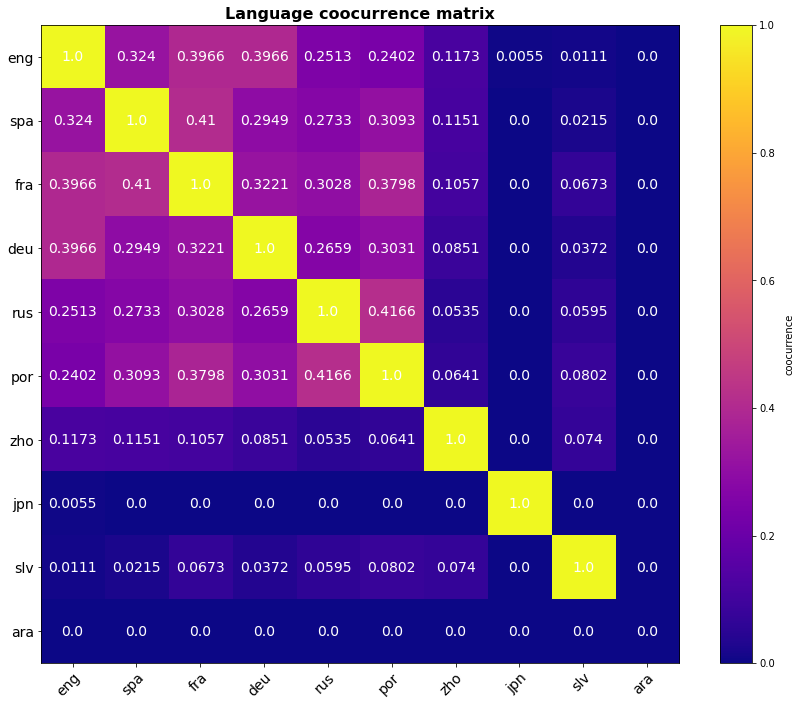

In [32]:
heatmap(matrix=lang_coocurrence_mx(relative=True, coocur=True), cmap='plasma')

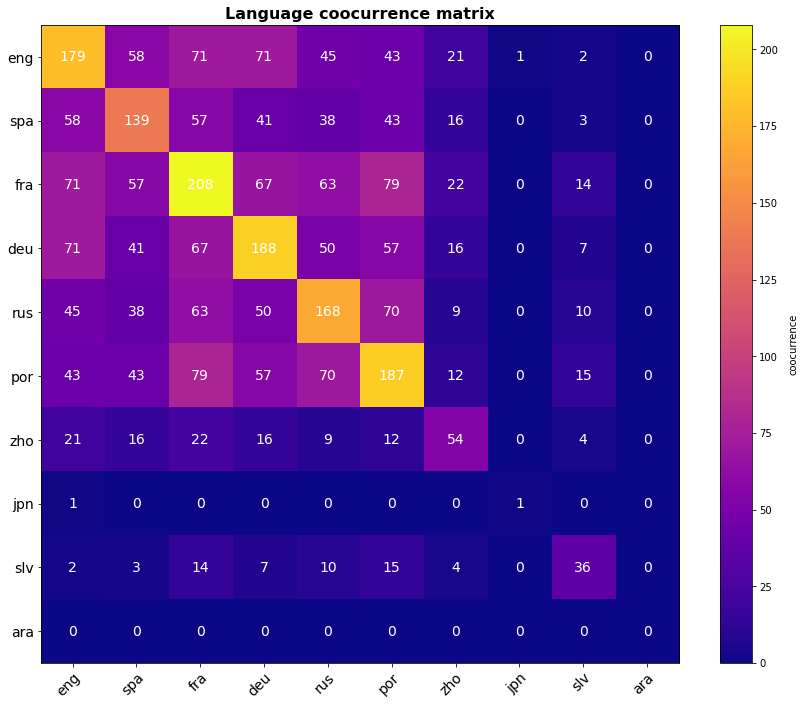

In [38]:
heatmap(matrix=lang_coocurrence_mx(relative=False, coocur=True), cmap="plasma")

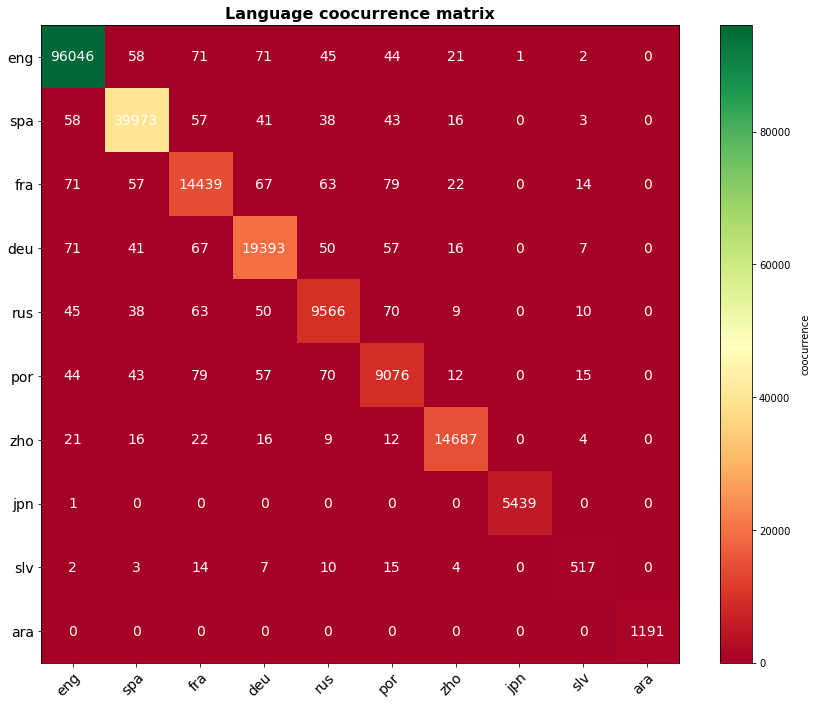

In [39]:
heatmap(matrix=lang_coocurrence_mx(relative=False, coocur=False), cmap="RdYlGn")

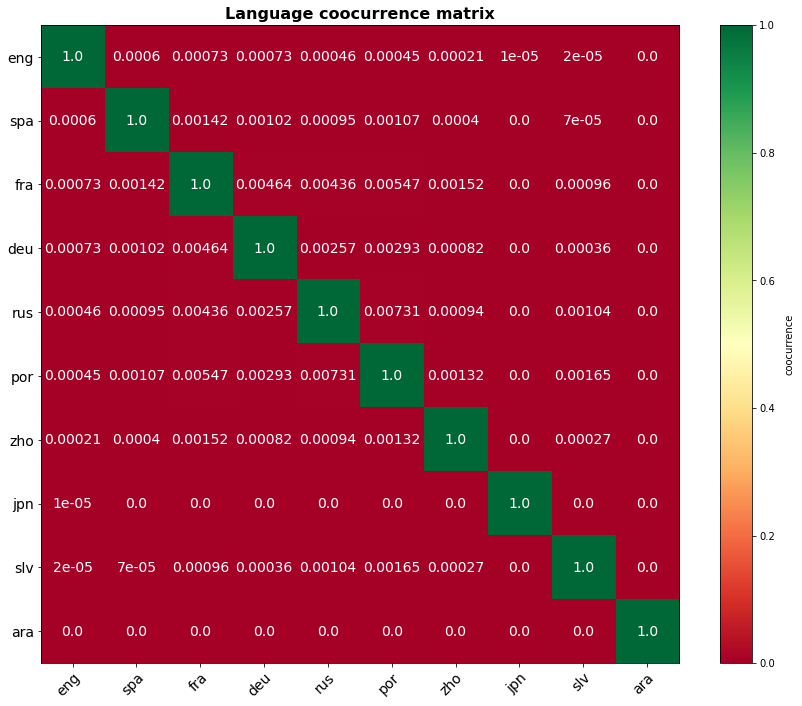

In [40]:
heatmap(matrix=lang_coocurrence_mx(relative=True, coocur=False, accuracy=100000), cmap="RdYlGn")

In [77]:
def lang_line_chart(data_frame: pd.core.frame.DataFrame=data_frame, lang_list: list=['eng', 'spa', 'fra', 'deu', 'rus', 'por', 'zho', 'jpn', 'slv', 'ara']):
    data_frame_lang_stacked = data_frame[['date', 'lang']]
    lang_count_df = data_frame_lang_stacked.groupby(["date", "lang"]).size().reset_index(name="count")

    plt.figure(figsize=(48,16))
    for lang in lang_list:
        lang_df = lang_count_df .loc[lang_count_df['lang'] == lang]
        plt.plot(lang_df['date'], lang_df['count'], label = lang)
        plt.legend(loc='upper right')
    
    plt.show()

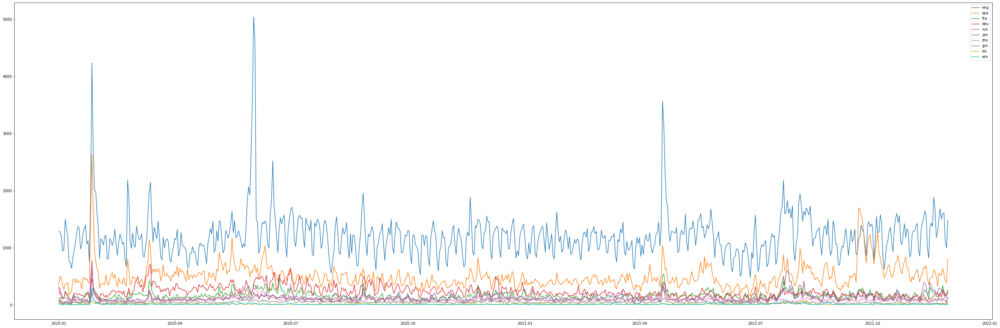

In [138]:
lang_line_chart()

Analysis of the data set

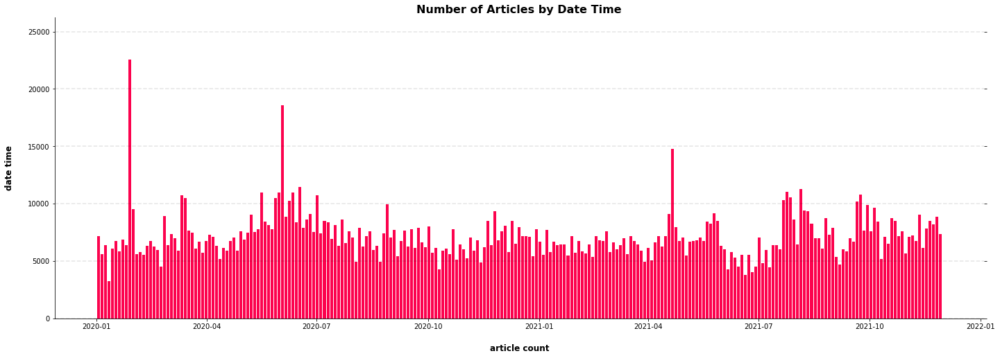

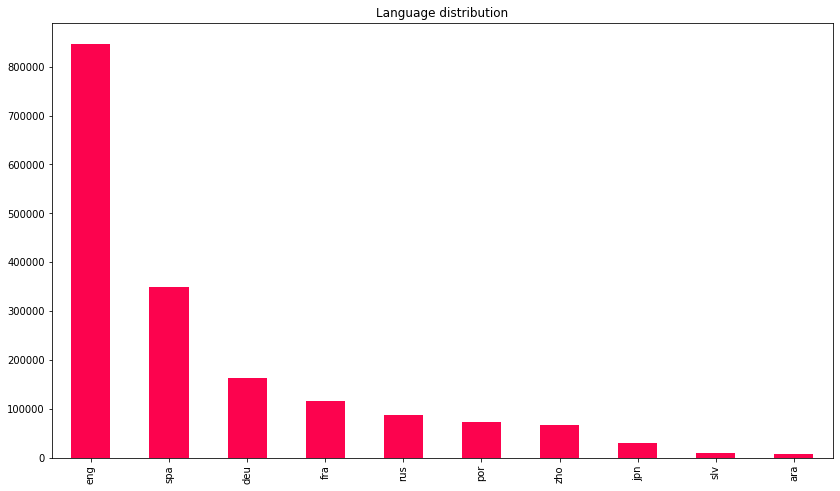

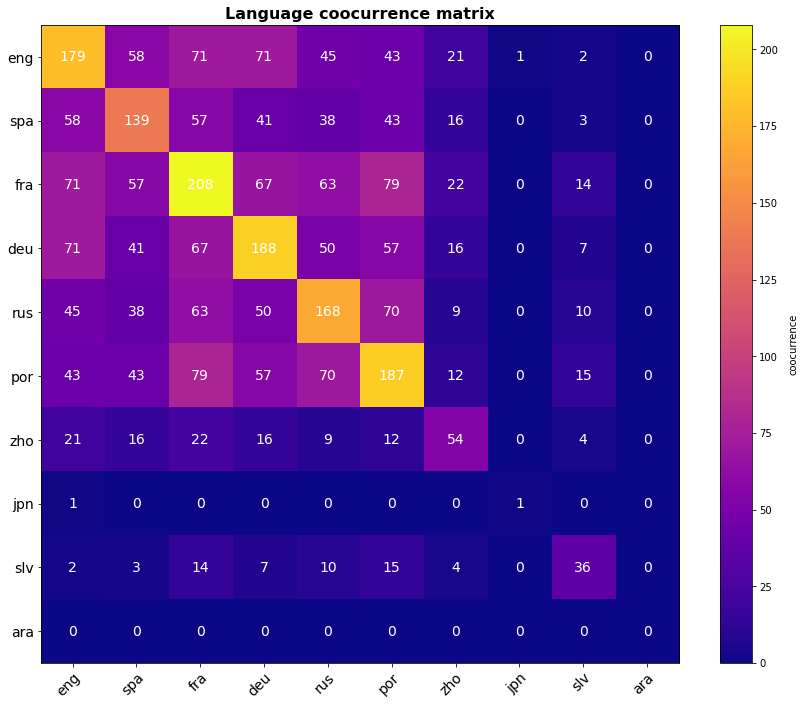

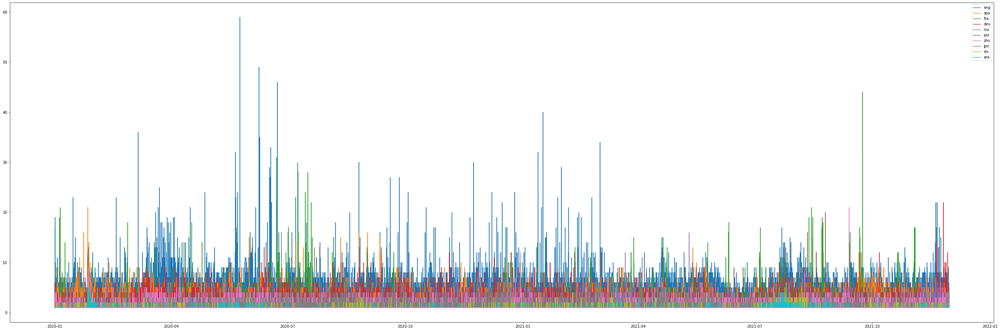

In [75]:
hist_plot()
bar_plot()
heatmap(matrix=lang_coocurrence_mx(relative=False))
duplicates()
lang_line_chart()

TODO: 
- [ ] function to alter the data frame bsed on concept values
- [ ] iterate through unique sets of concept combination

# Unique concept list analysis

In [129]:
mod_df = date_frame_wstr_concepts[['title', 'body', 'isDuplicate', 'lang', 'date', 'eventUri', 'concepts']].copy()
mod_df

,title,body,isDuplicate,lang,date,eventUri,concepts
0,A look back at Boston's year in sports - The B...,The Bruins exceeded expectations and came tant...,False,eng,2020-01-01,None,"basketball, nba"
1,This is it for the Vikings!,Last column of the year for 2019 and first for...,False,eng,2020-01-01,eng-5386095,"basketball, nba"
2,新年の到来、煙や催涙ガスと共に 祝賀ムードに影,【1月1日 AFP】2020年の幕開けとなった1日、世界各地で新年を祝う催しが行われたが、一...,False,jpn,2020-01-01,None,"hong_kong, demonstration"
3,LeBron James es elegido el mejor deportista de...,El actual alero de los Lakers derrotó en las v...,False,spa,2020-01-01,None,"basketball, nba"
4,Hot Button: Dorsey out as Browns GM ... Rhule ...,"ROCHESTER, N.Y. -- Hot Button is a 'round-the-...",False,eng,2020-01-01,eng-5388538,"basketball, nba"
...,...,...,...,...,...,...,...
1750320,"Chris Sutton predicts where Chelsea, Man Utd, ...",Chris Sutton has predicted the final Premier L...,False,eng,2021-11-29,None,"association_football, premier_league"
1750321,¡MESSI LEGENDARIO! El argentino conquistó su s...,Entornointeligente.com / Lionel Messi conquist...,False,spa,2021-11-29,spa-2575437,"association_football, la_liga"
1750322,Man United: Graeme Souness is baffled by Ralf ...,Liverpool legend Graeme Souness said he did no...,False,eng,2021-11-29,eng-7296298,"association_football, premier_league"
1750323,A Seventh-day Adventist church pastor called o...,Philadelphia man shot dead his ex-girlfriend i...,False,eng,2021-11-29,eng-7301888,me_too_movement


In [130]:
unique_concept_list = mod_df['concepts'].drop_duplicates()
unique_concept_list = list(unique_concept_list)
unique_concept_list

['basketball, nba',
 'hong_kong, demonstration',
 'presidency_of_the_council_of_the_european_union',
 'european_migrant_crisis',
 'association_football, premier_league',
 'me_too_movement',
 'association_football, la_liga',
 'black_lives_matter',
 'volcano, types_of_volcanic_eruptions',
 'panama_papers',
 'association_football, bundesliga',
 'kobe_bryant, helicopter',
 'association_football, uefa_european_championship',
 'association_football, UEFA_europa_league',
 'olympic_games, japan, basketball',
 'olympic_games, japan, judo',
 'olympic_games, japan, table_tennis',
 'olympic_games, japan, swimming',
 'olympic_games, japan, rowing',
 'olympic_games, japan, skateboarding',
 'olympic_games, japan, sport_climbing',
 'paralympic_games, japan, basketball',
 'paralympic_games, japan, table_tennis',
 'paralympic_games, japan, judo',
 'paralympic_games, japan, swimming',
 'ever_given, suez_canal',
 'global_chip_shortage',
 'pandora_papers']

Iterating through concepts

basketball, nba


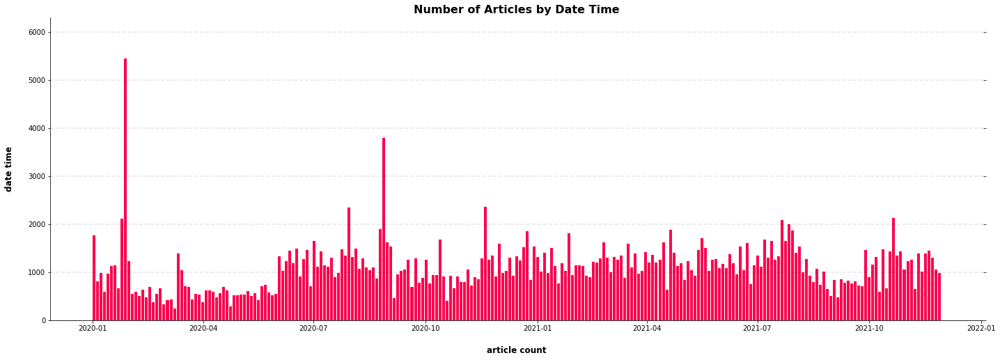

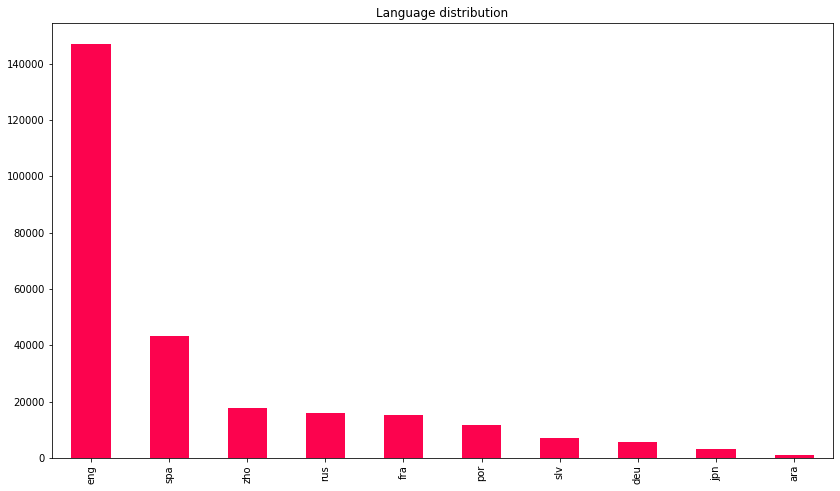

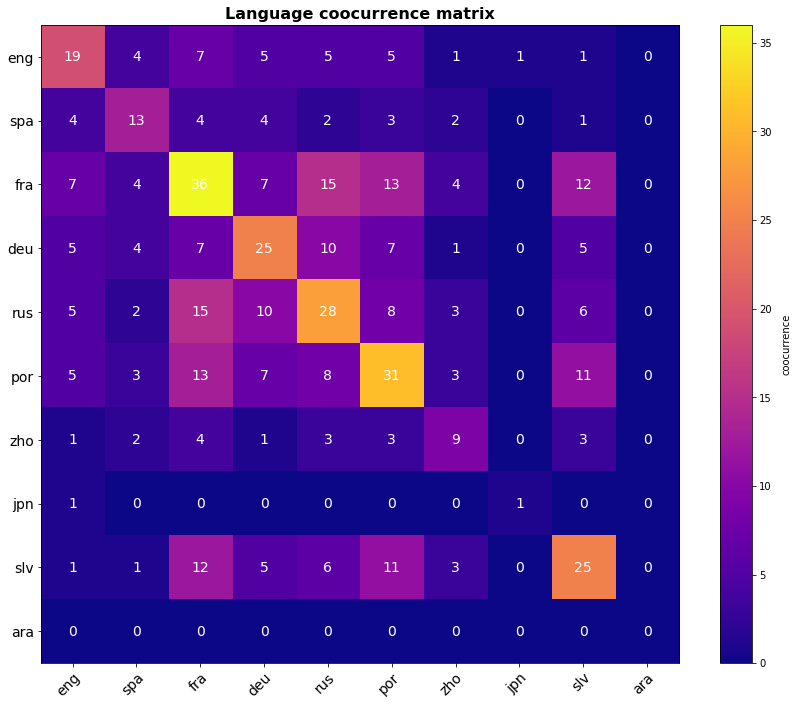

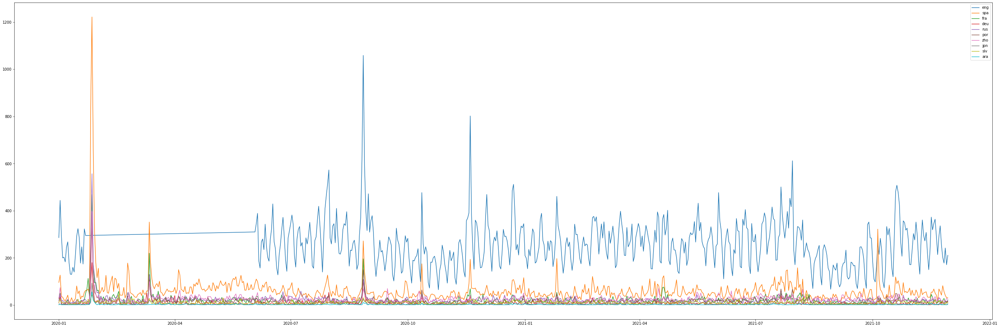

hong_kong, demonstration


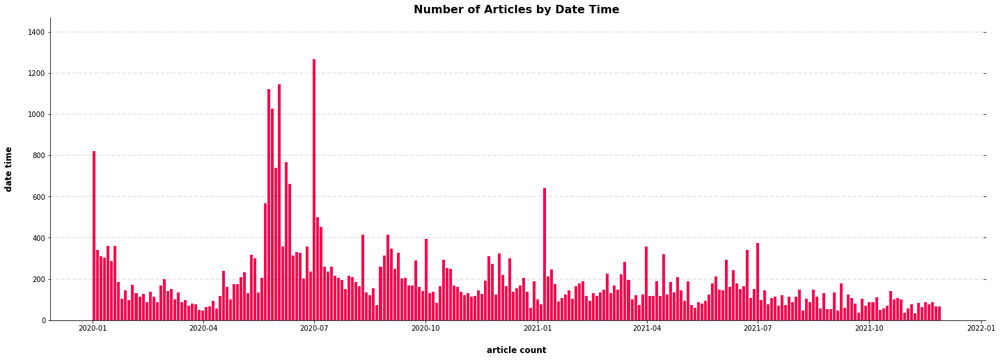

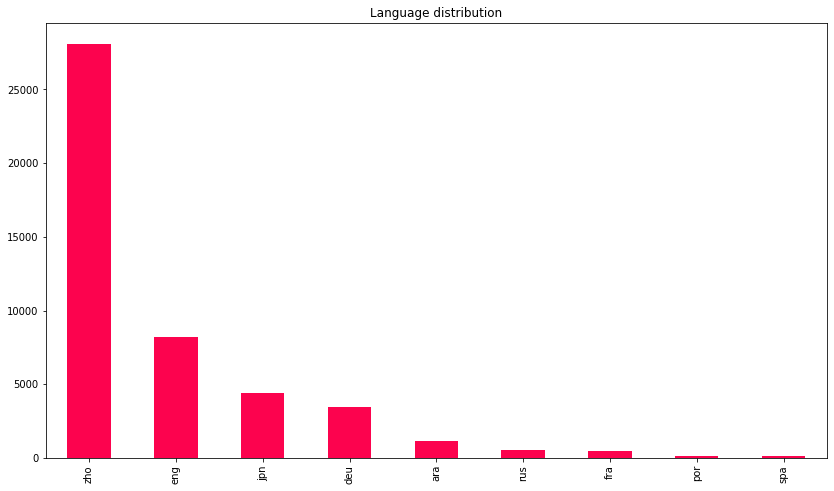

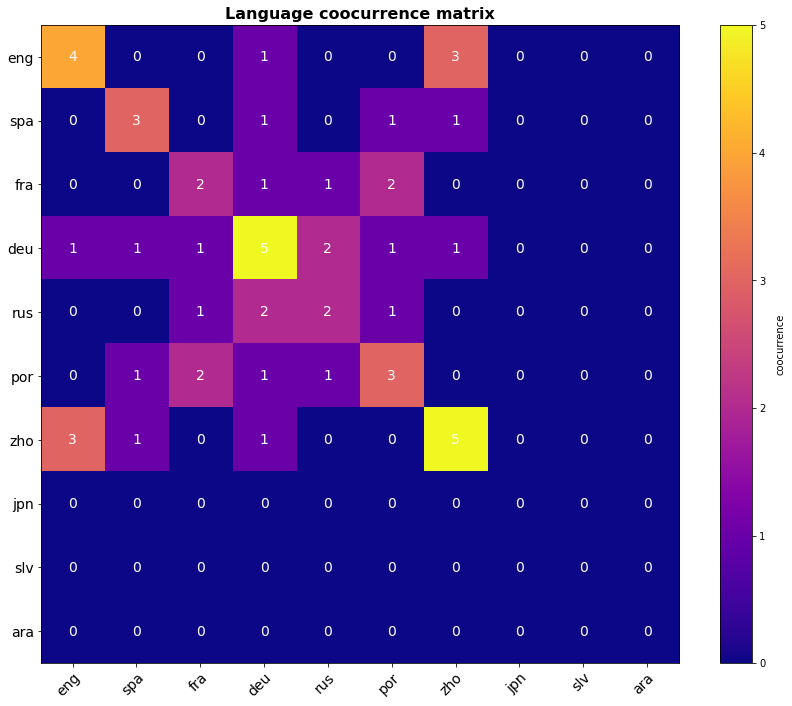

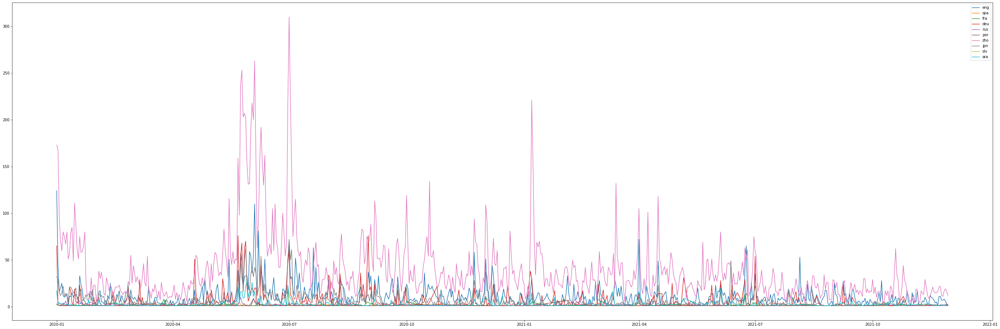

presidency_of_the_council_of_the_european_union


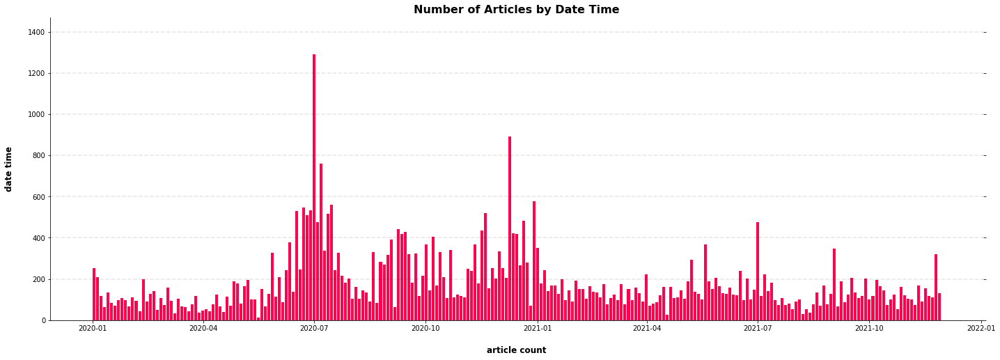

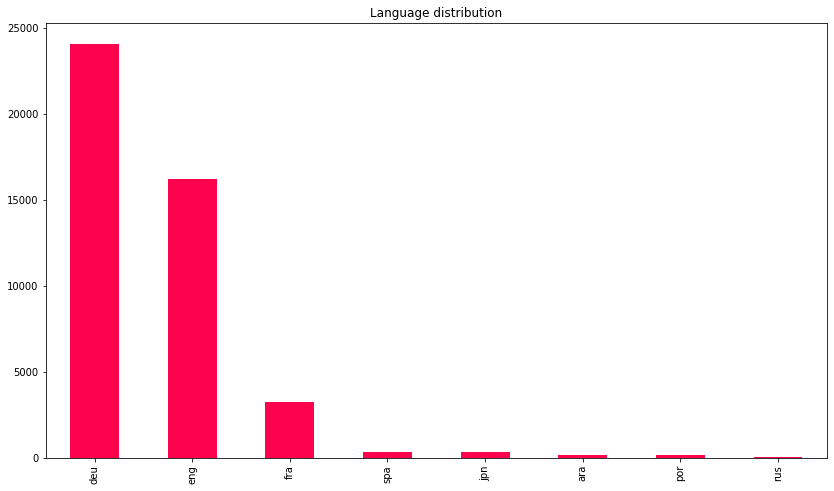

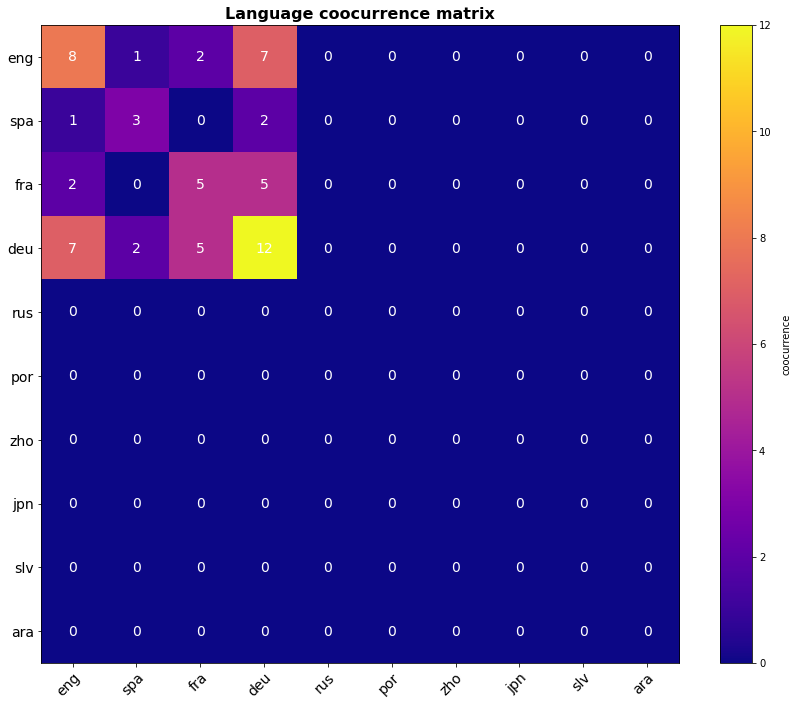

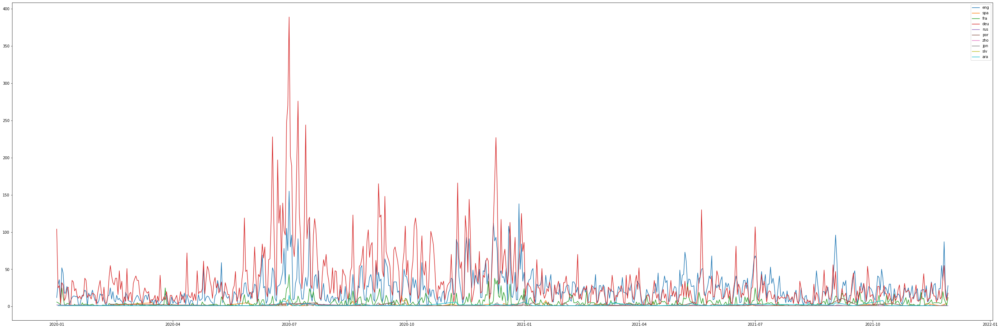

european_migrant_crisis


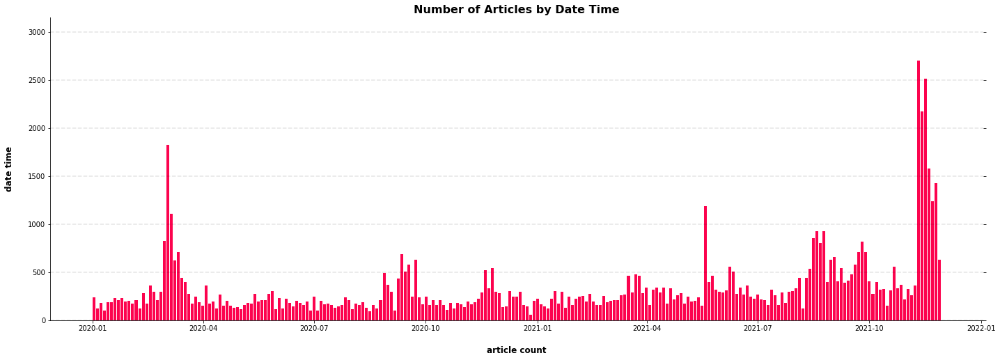

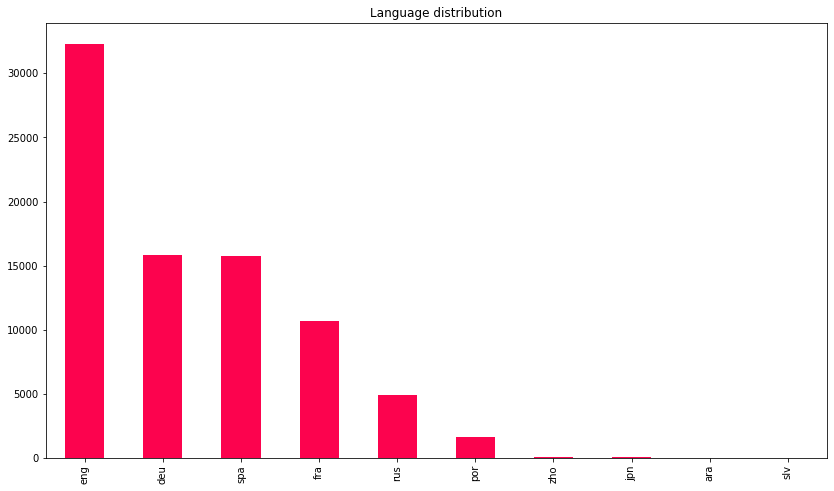

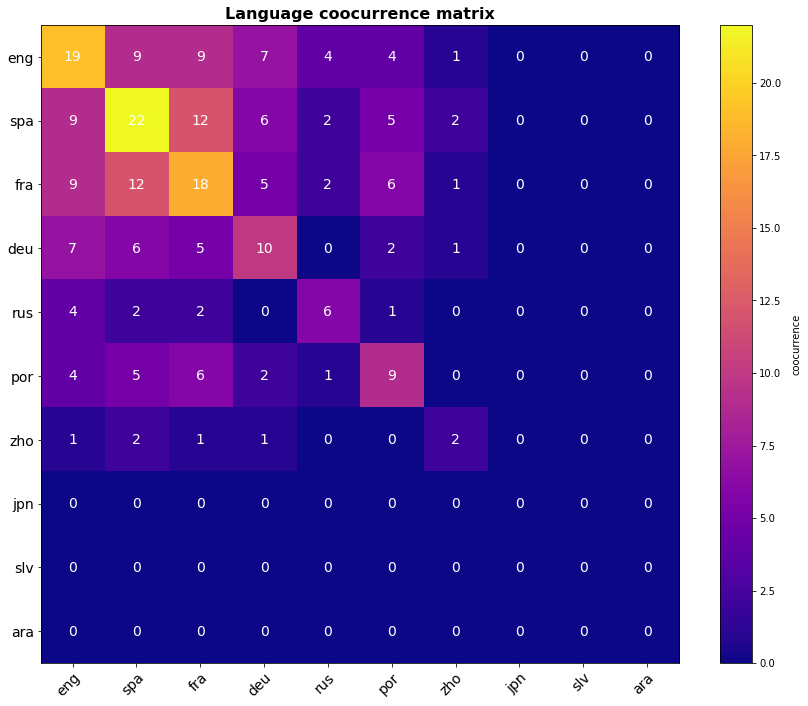

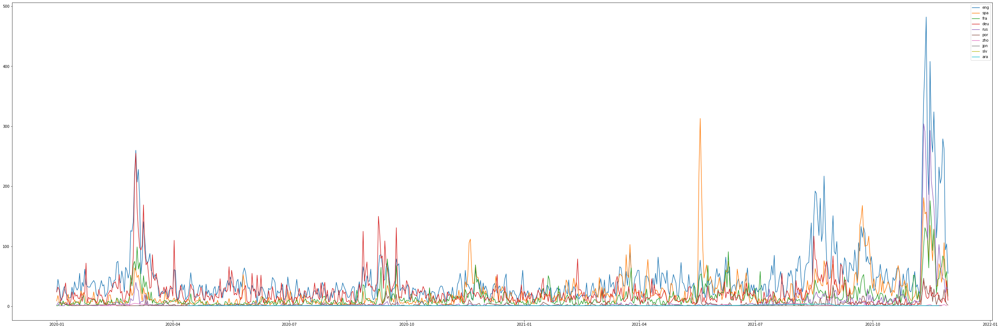

association_football, premier_league


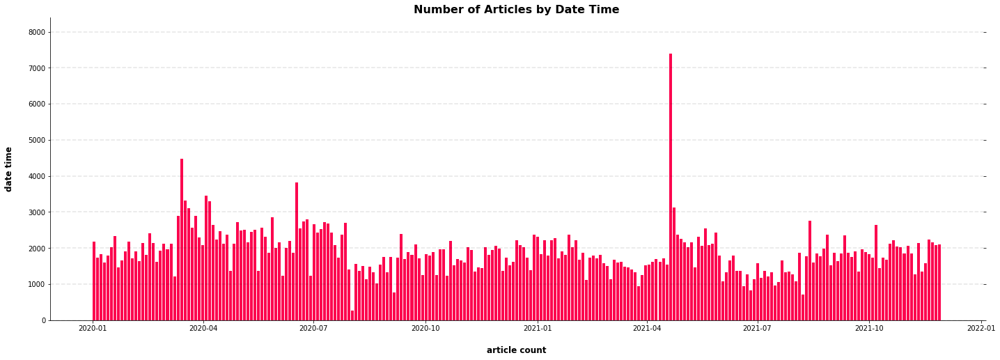

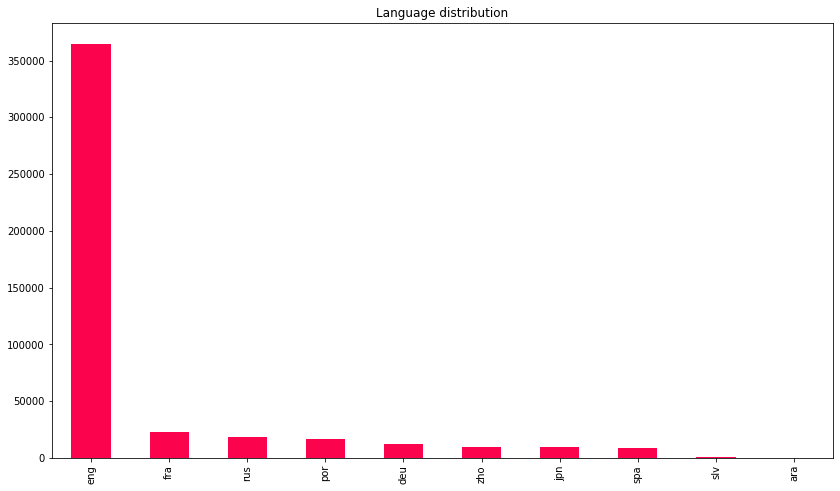

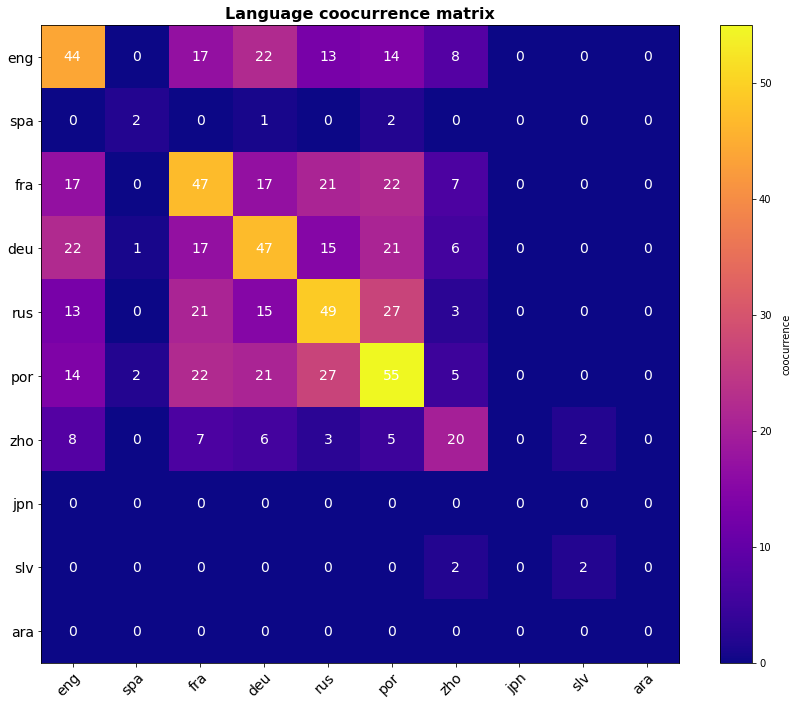

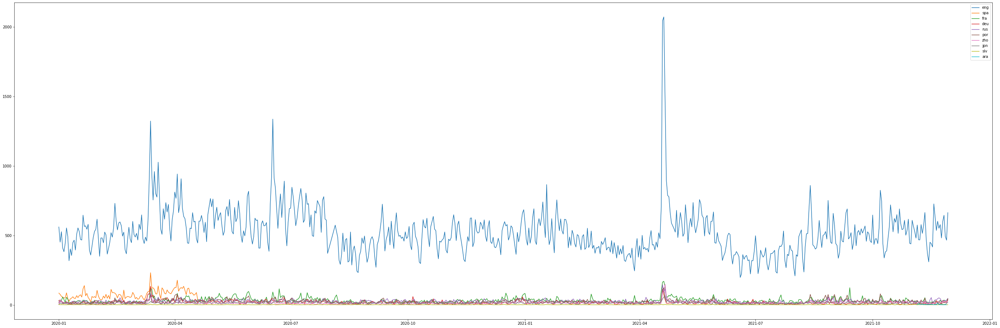

me_too_movement


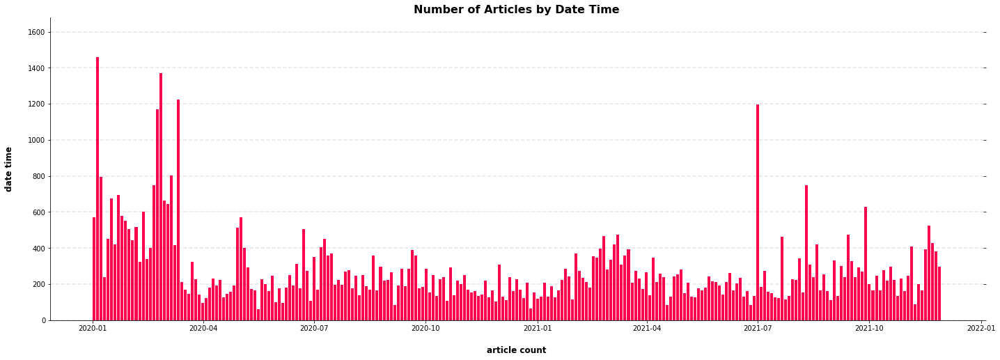

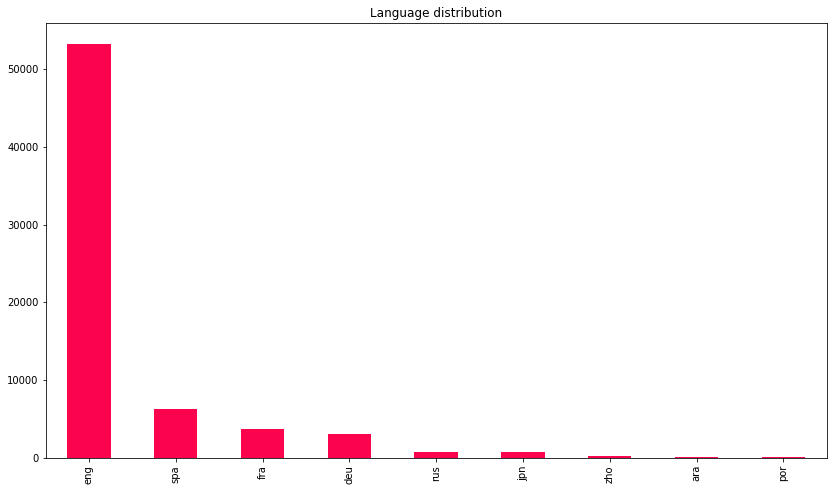

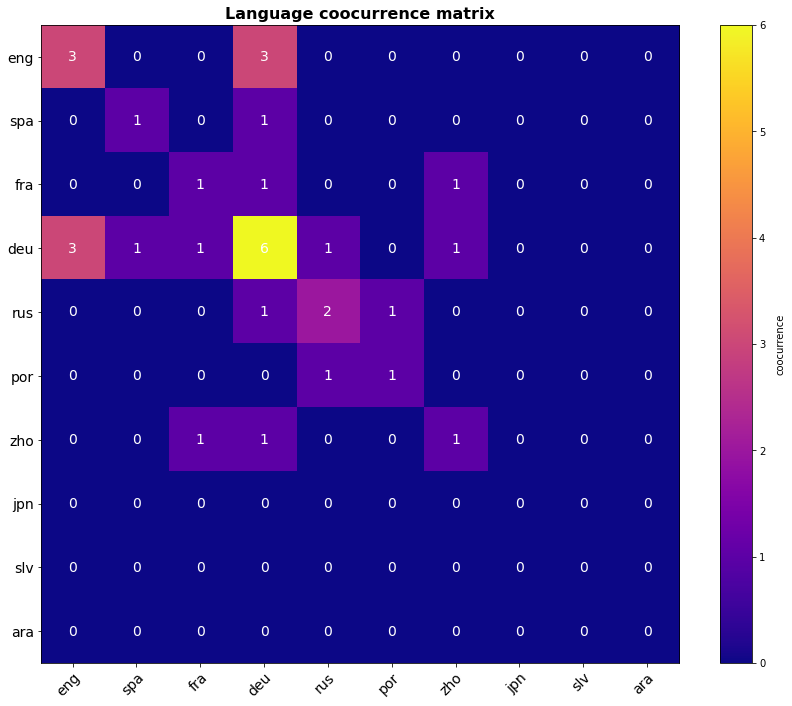

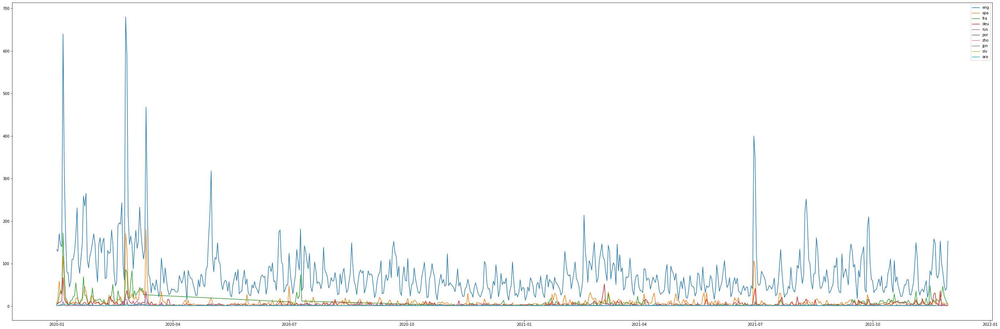

association_football, la_liga


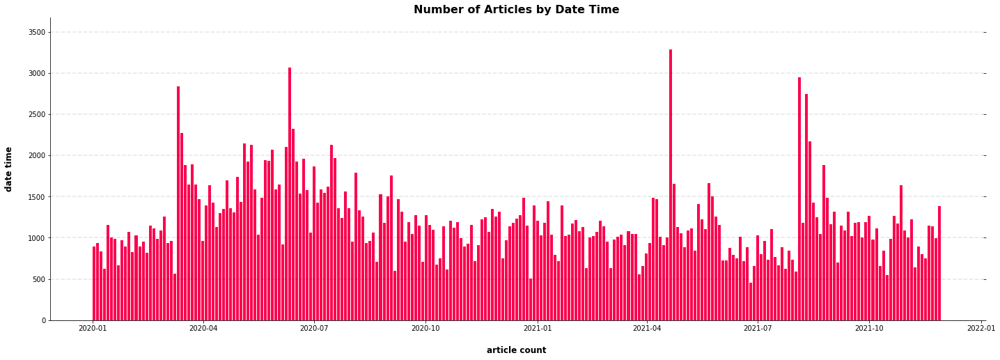

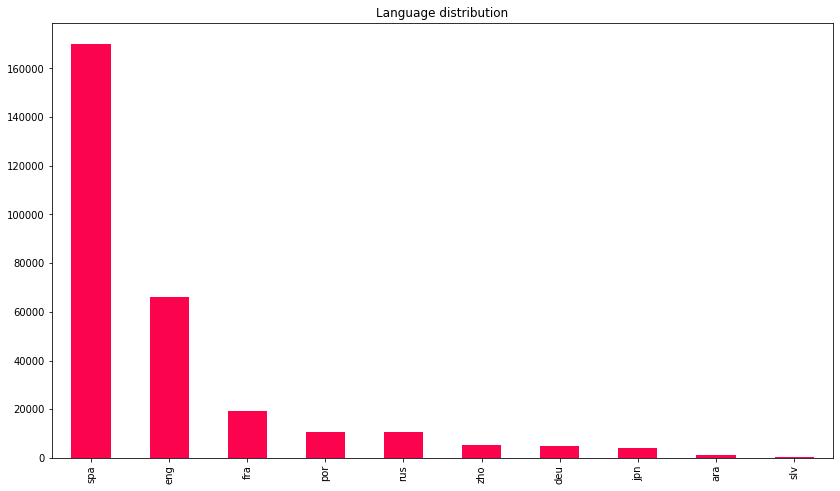

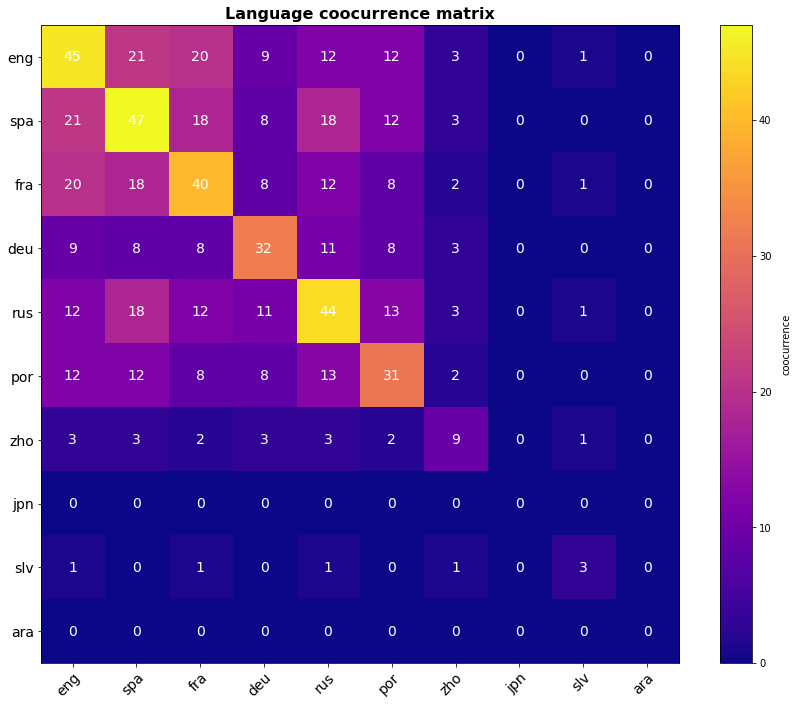

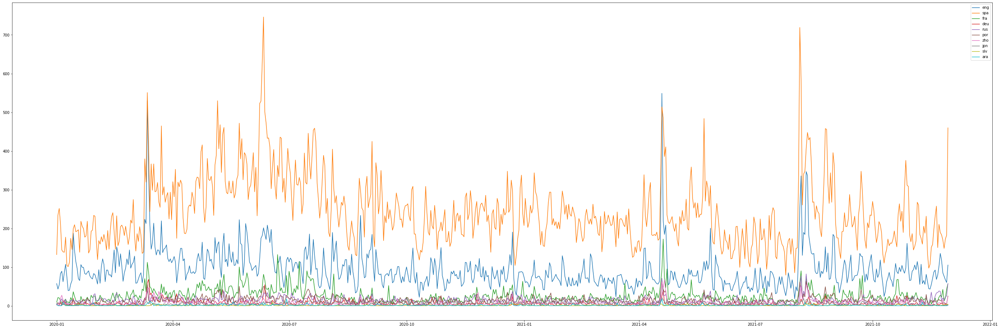

black_lives_matter


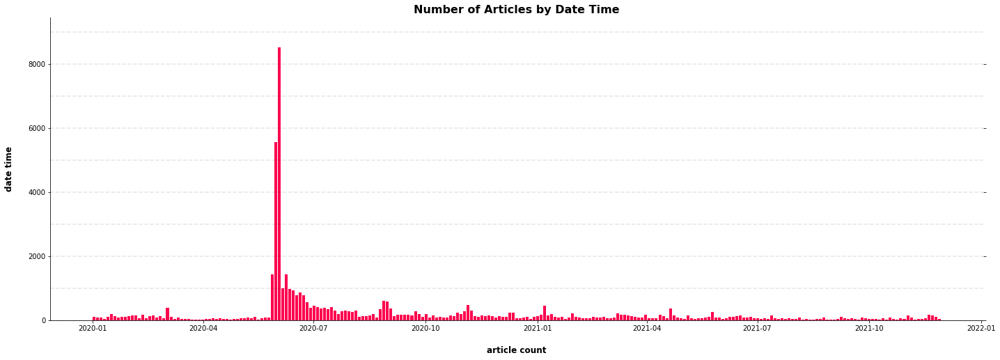

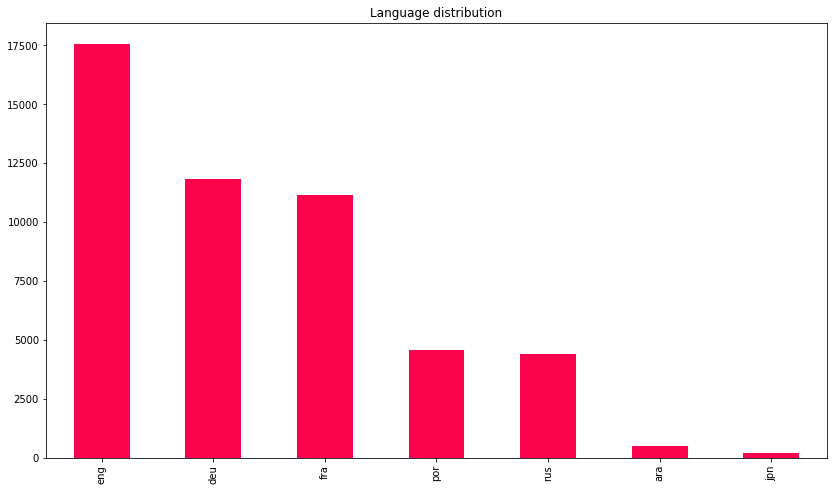

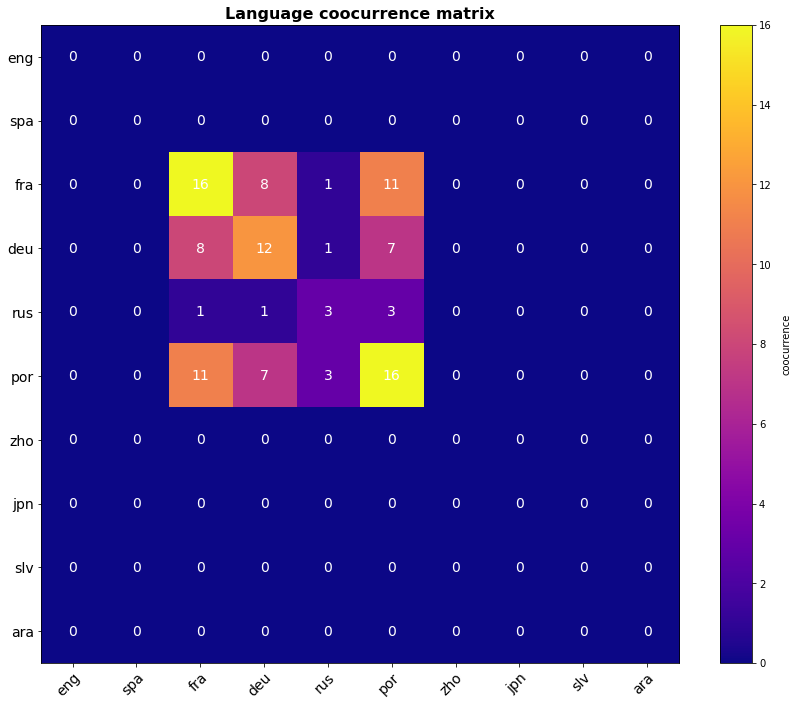

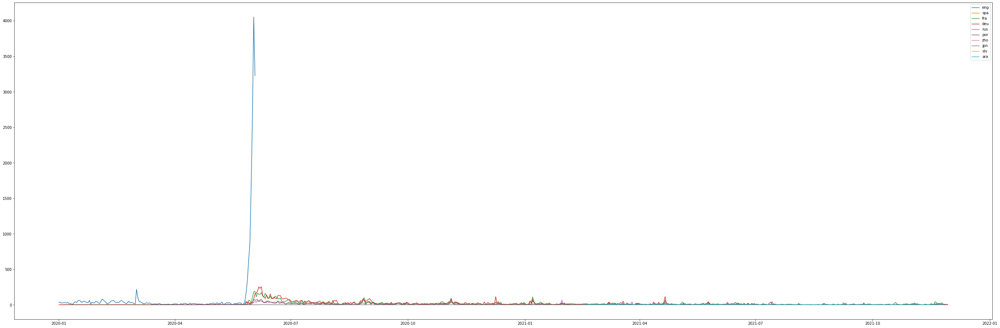

volcano, types_of_volcanic_eruptions


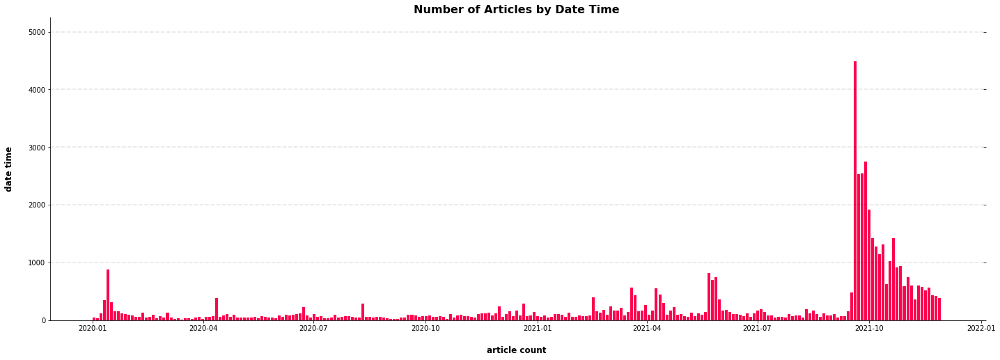

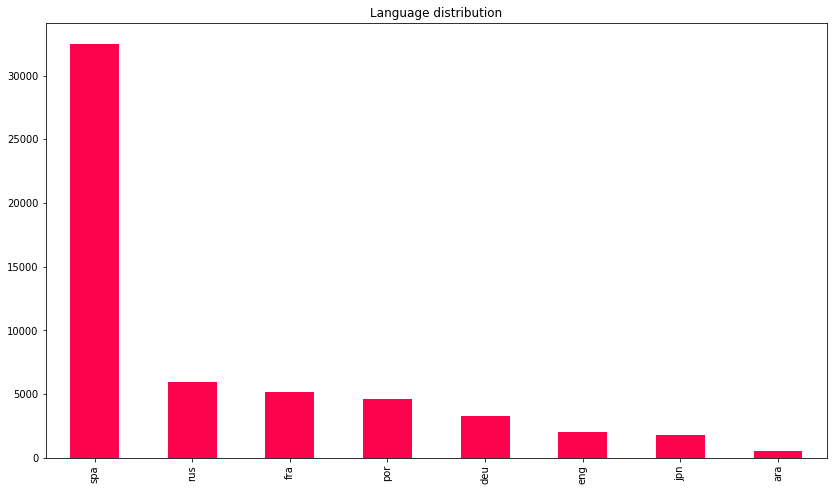

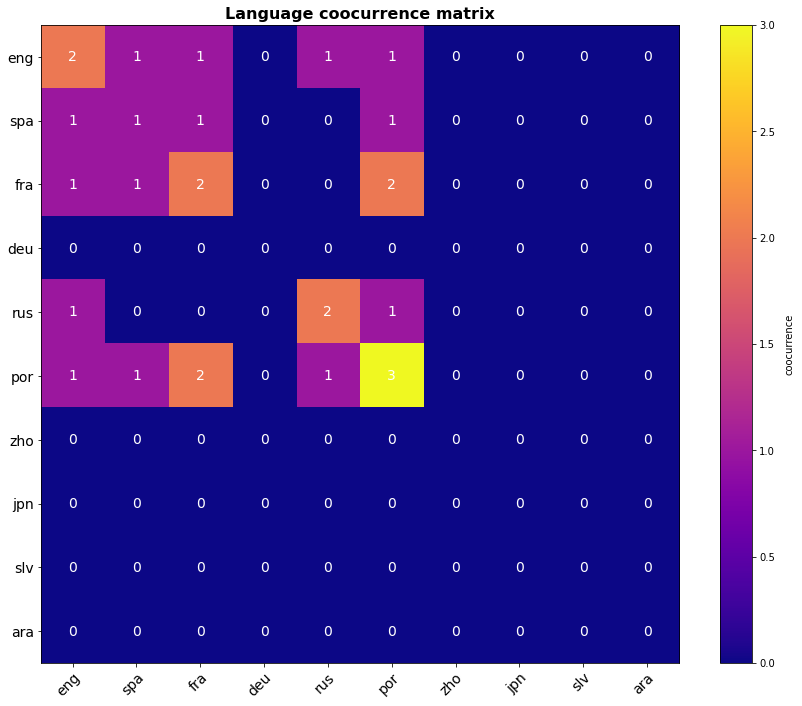

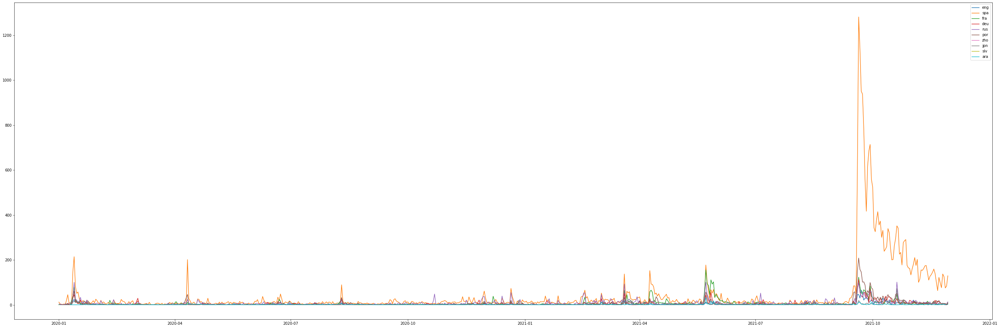

panama_papers


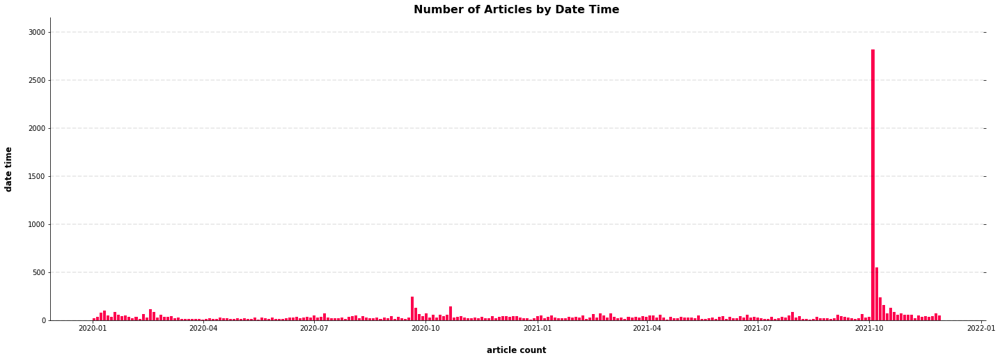

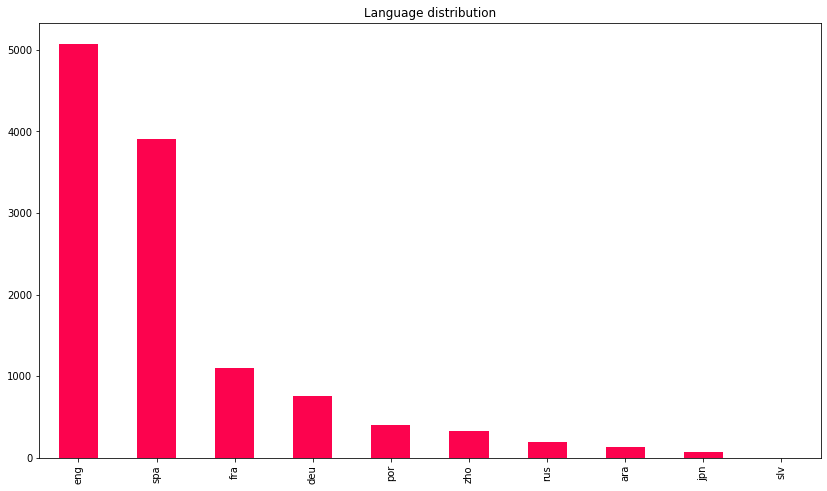

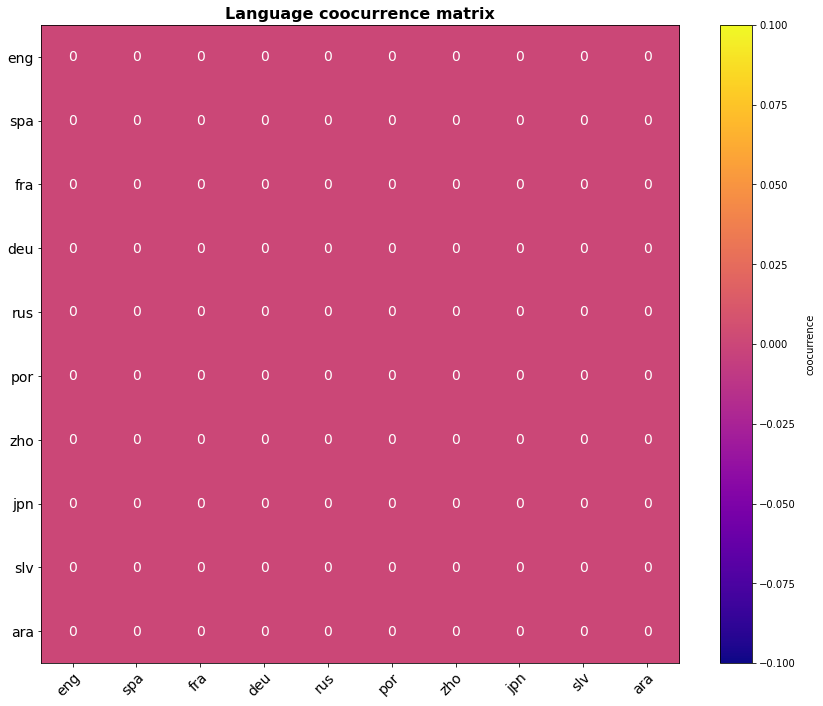

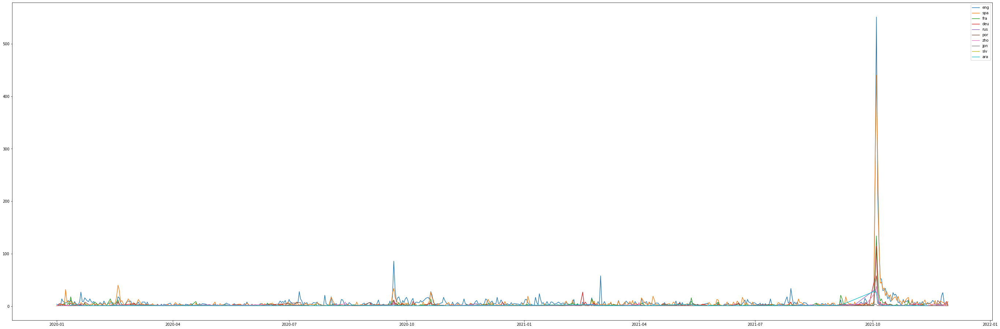

association_football, bundesliga


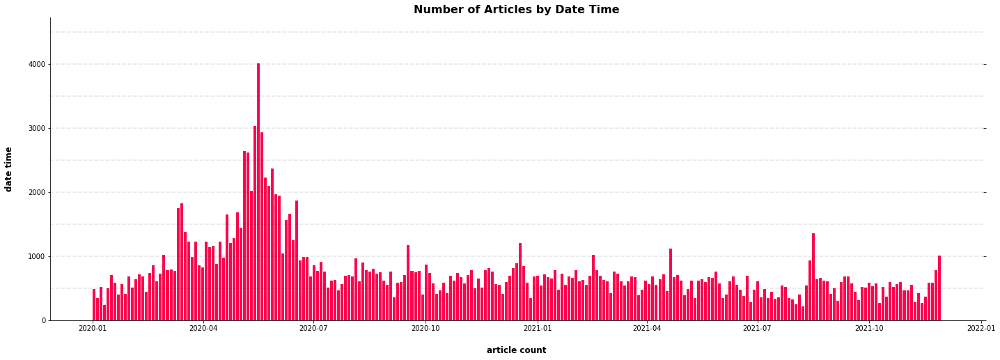

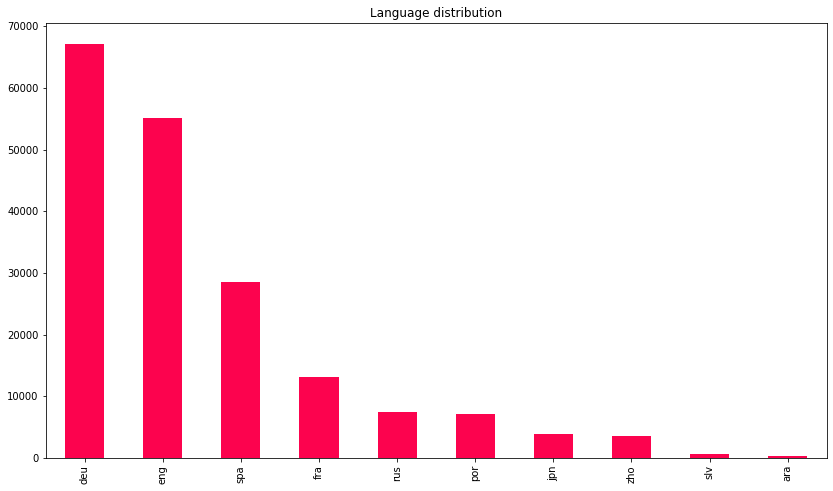

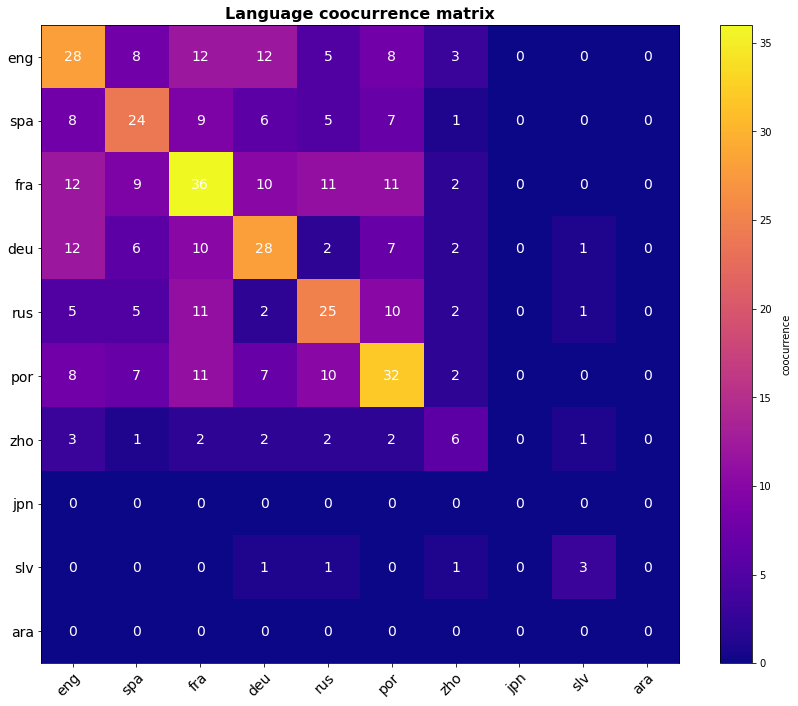

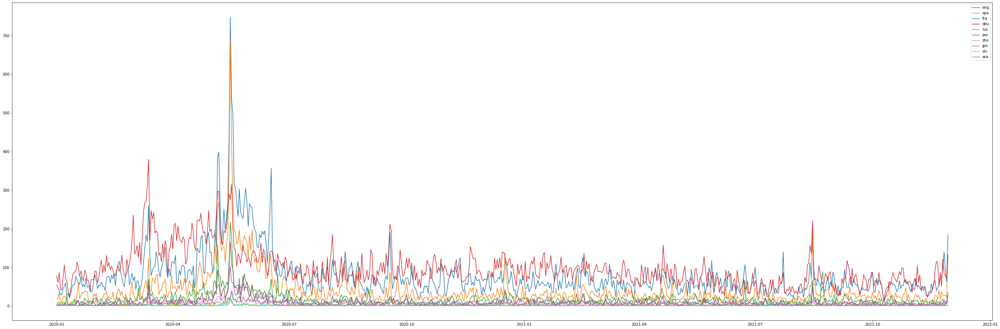

kobe_bryant, helicopter


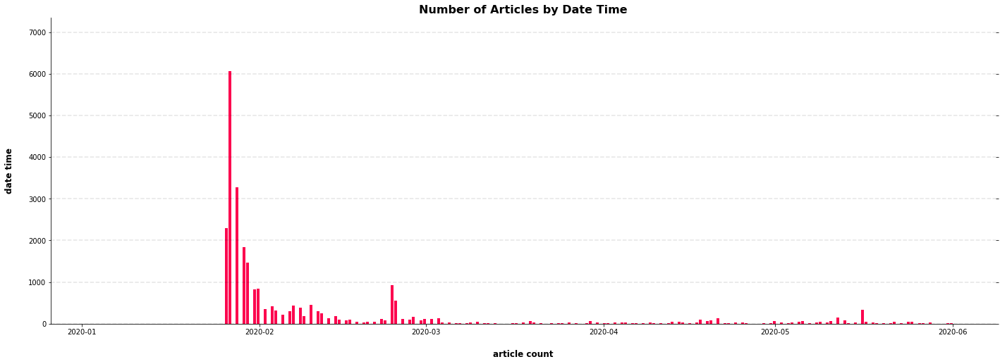

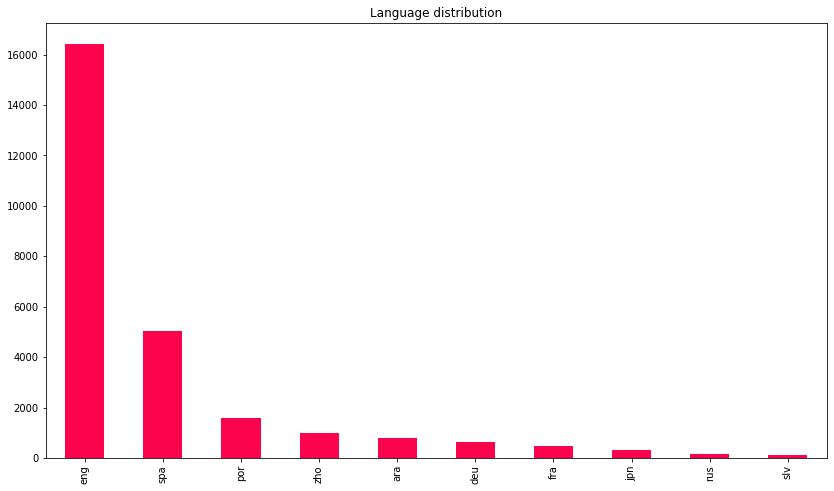

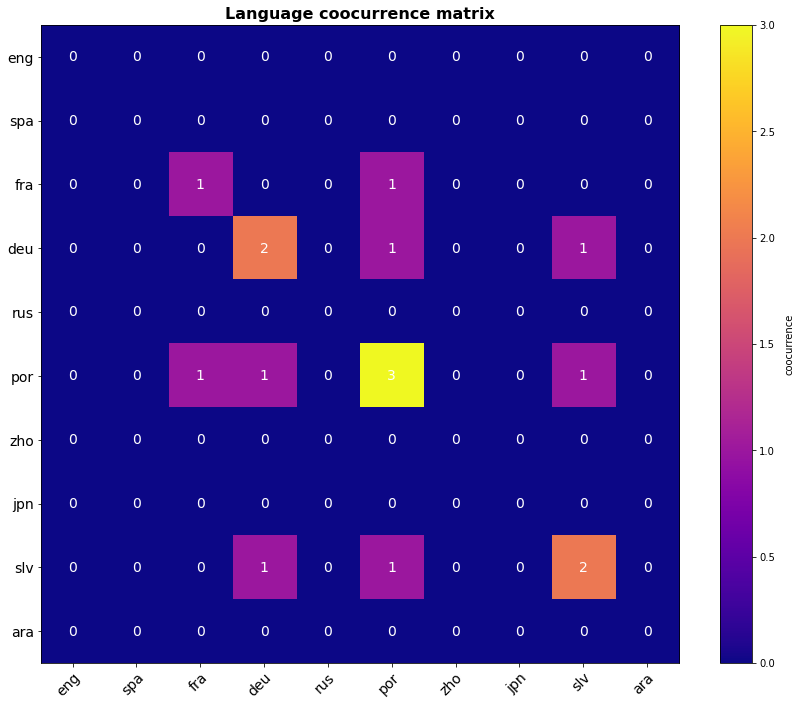

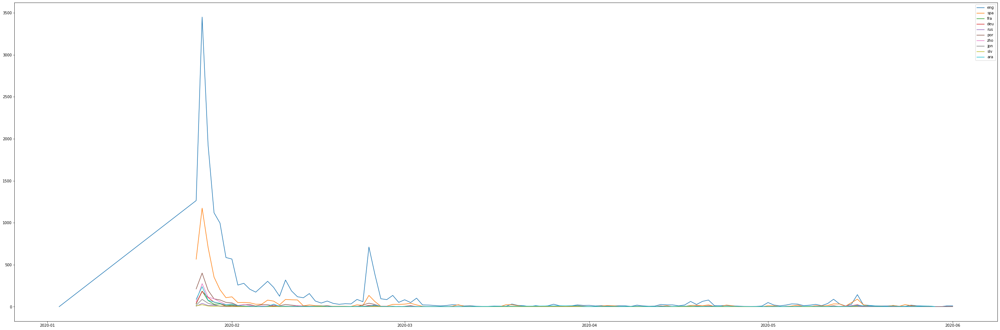

association_football, uefa_european_championship


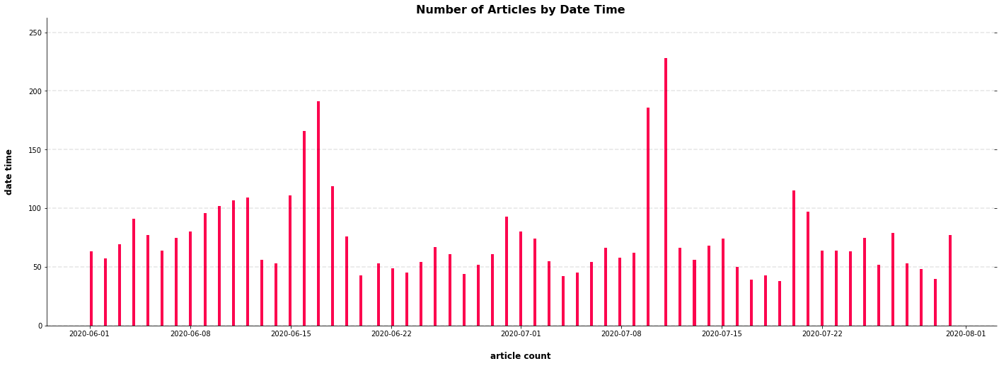

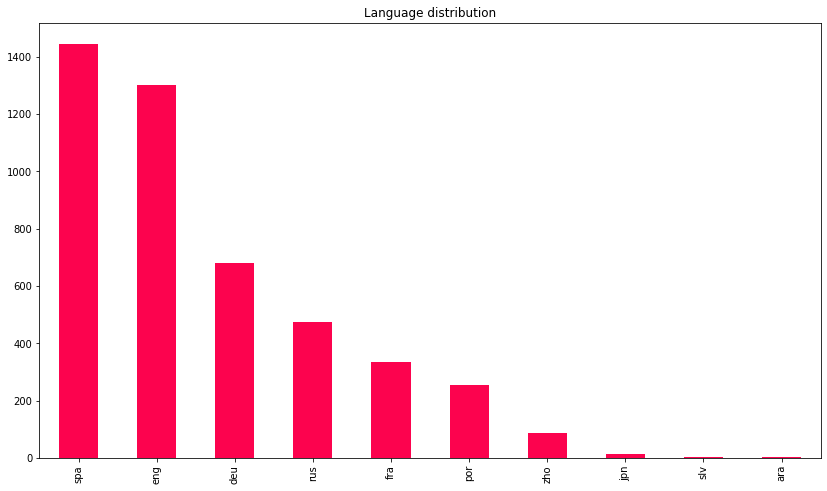

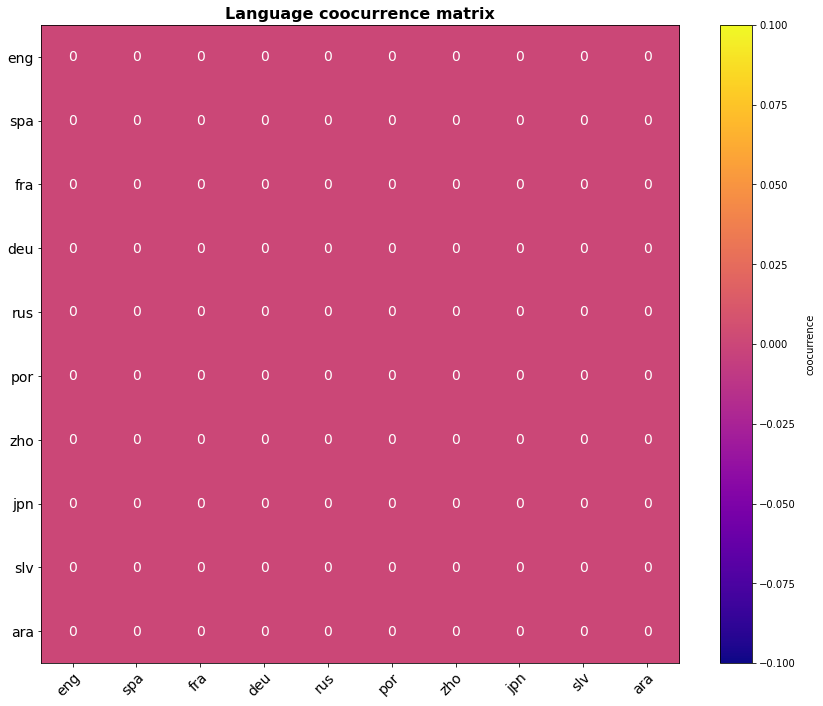

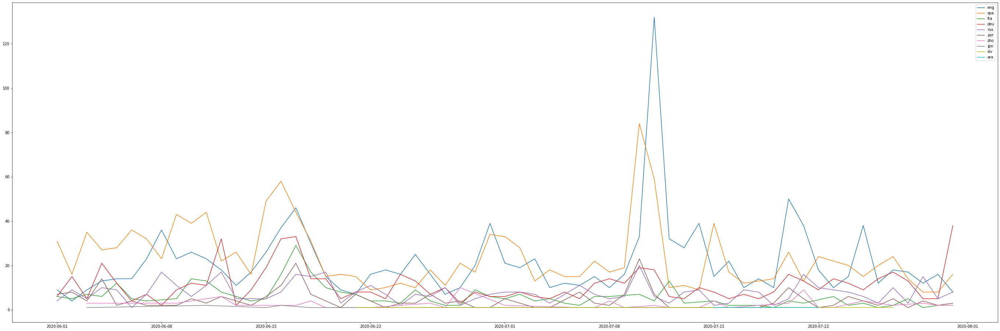

association_football, UEFA_europa_league


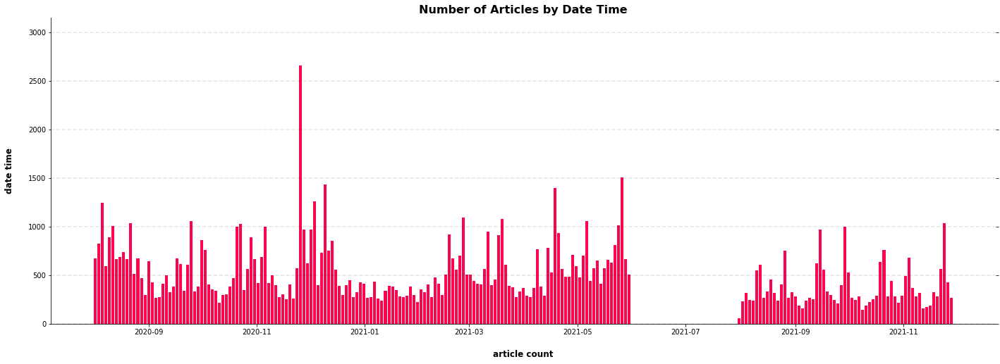

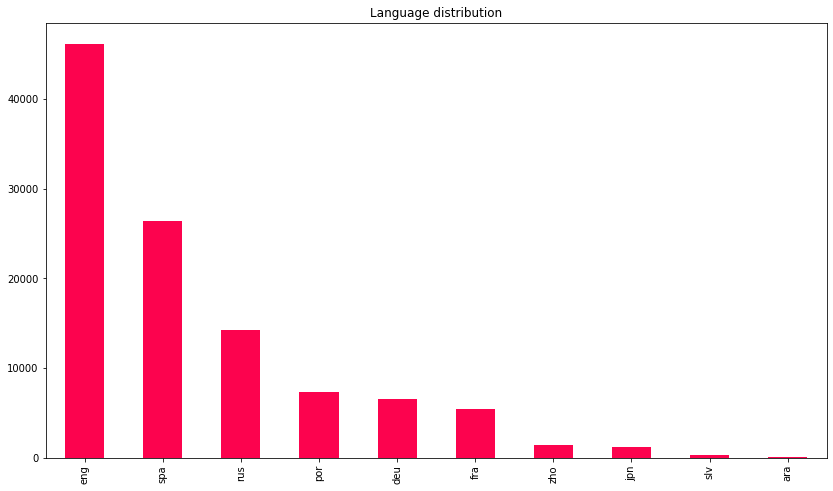

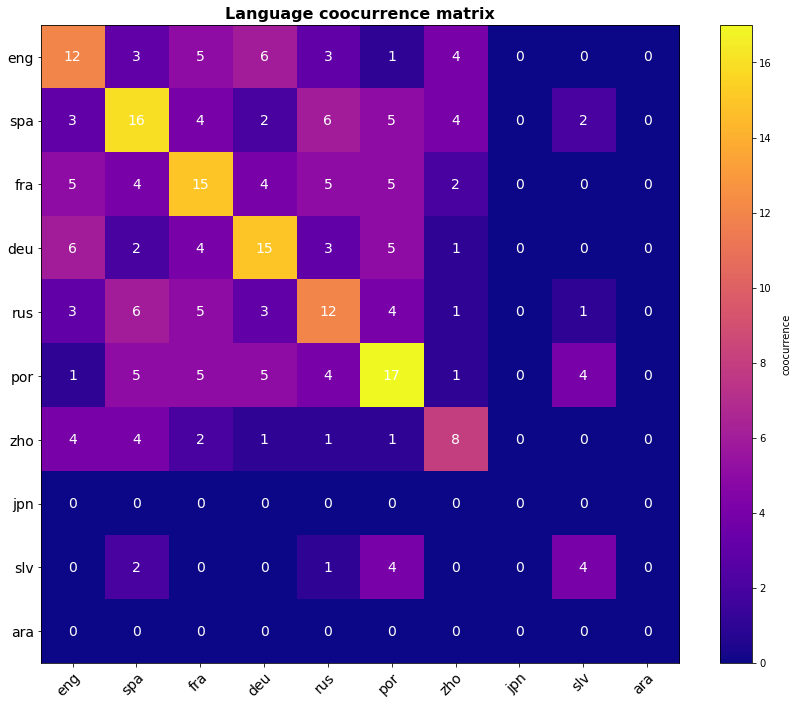

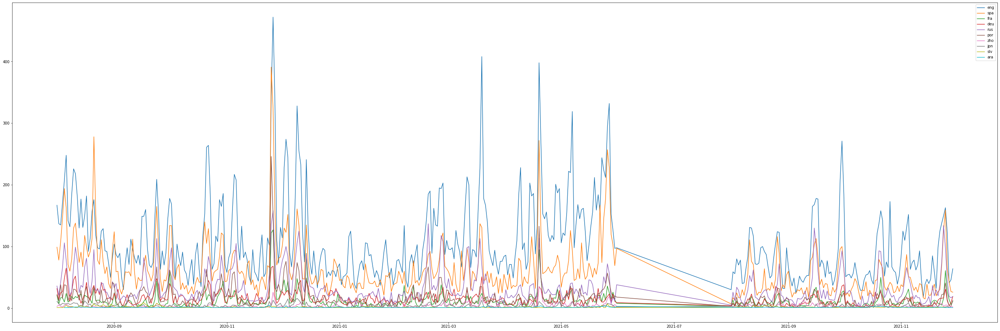

olympic_games, japan, basketball


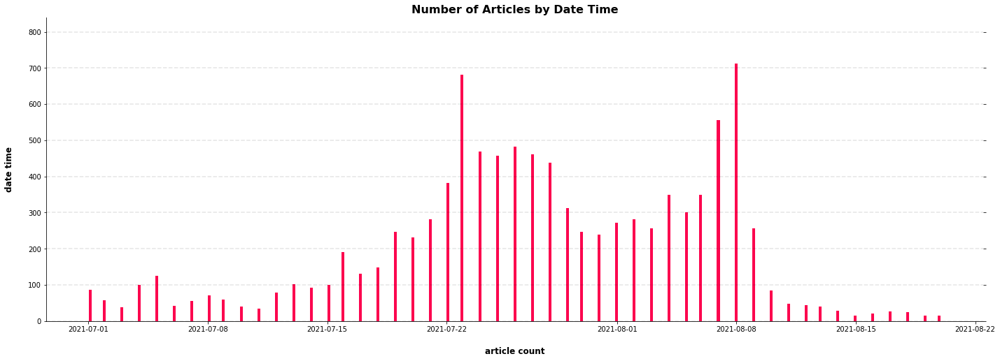

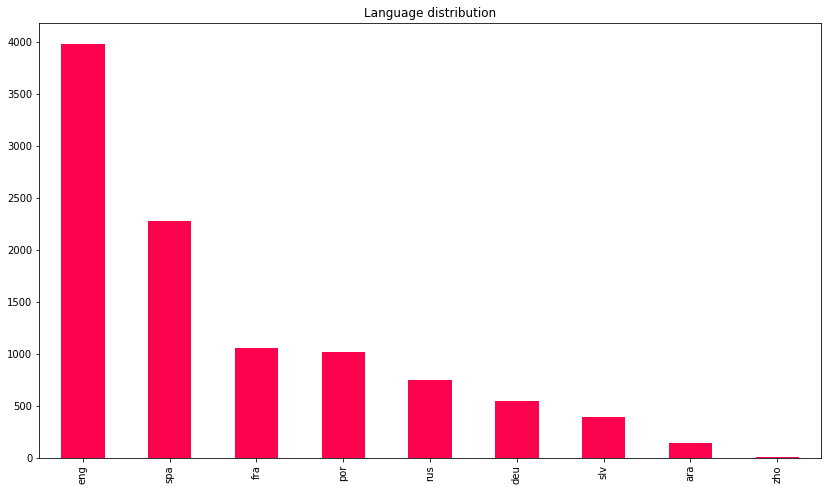

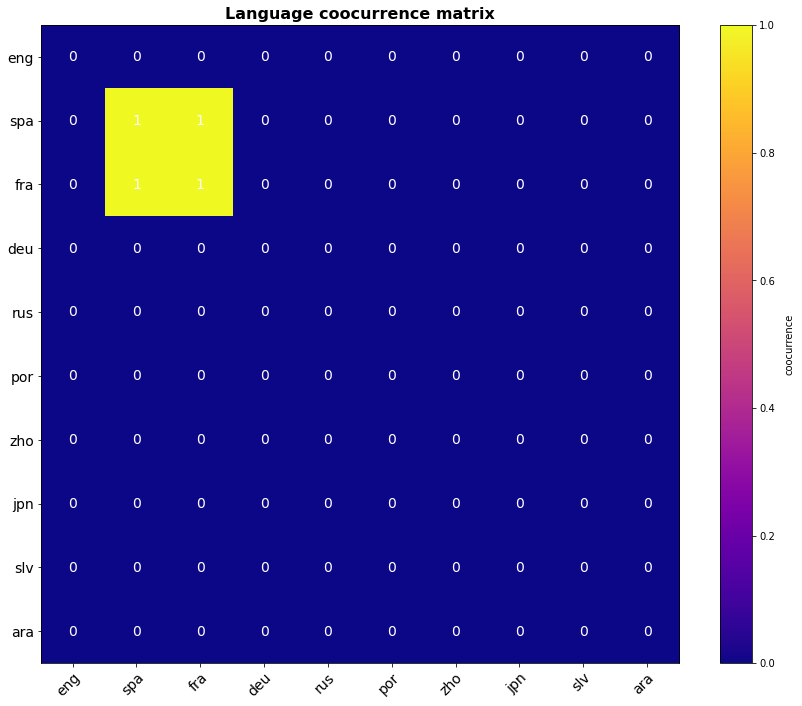

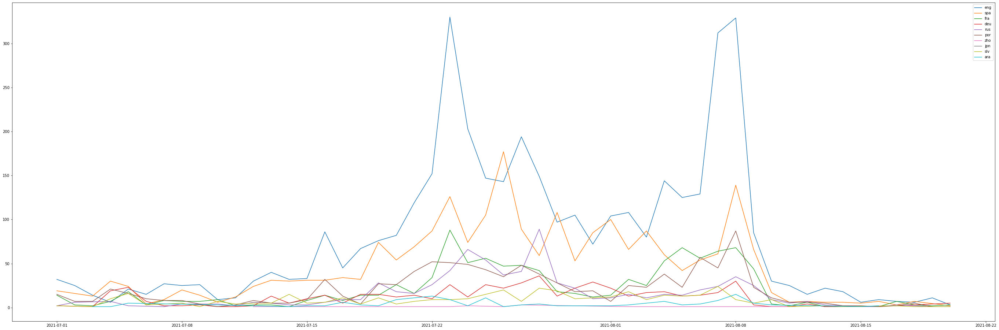

olympic_games, japan, judo


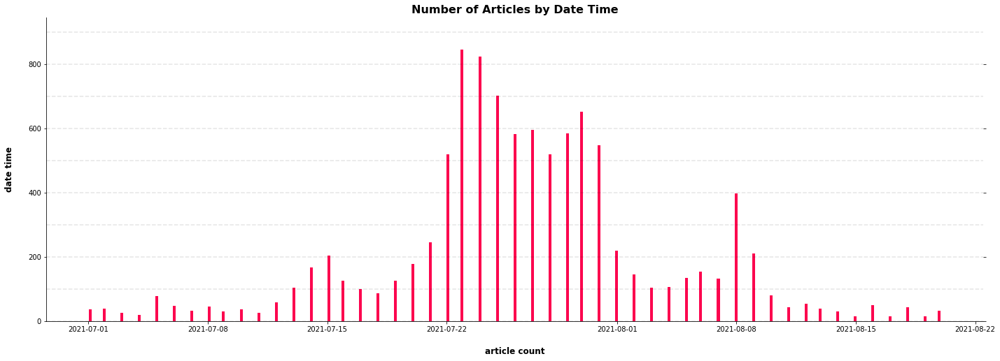

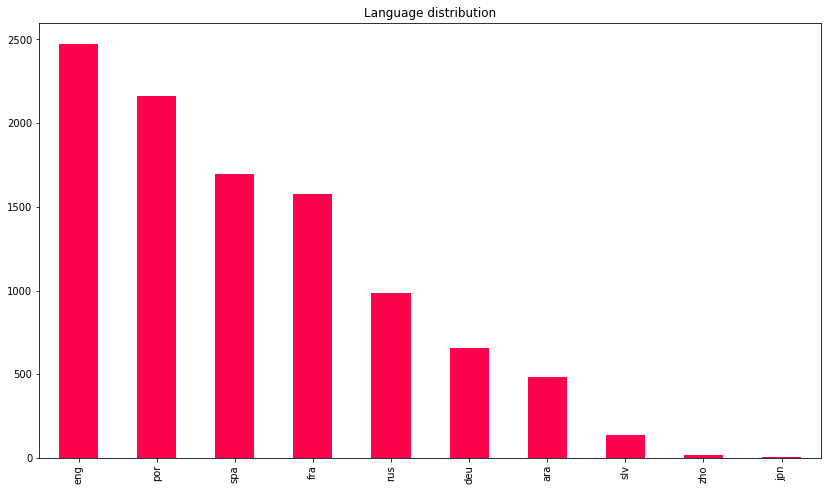

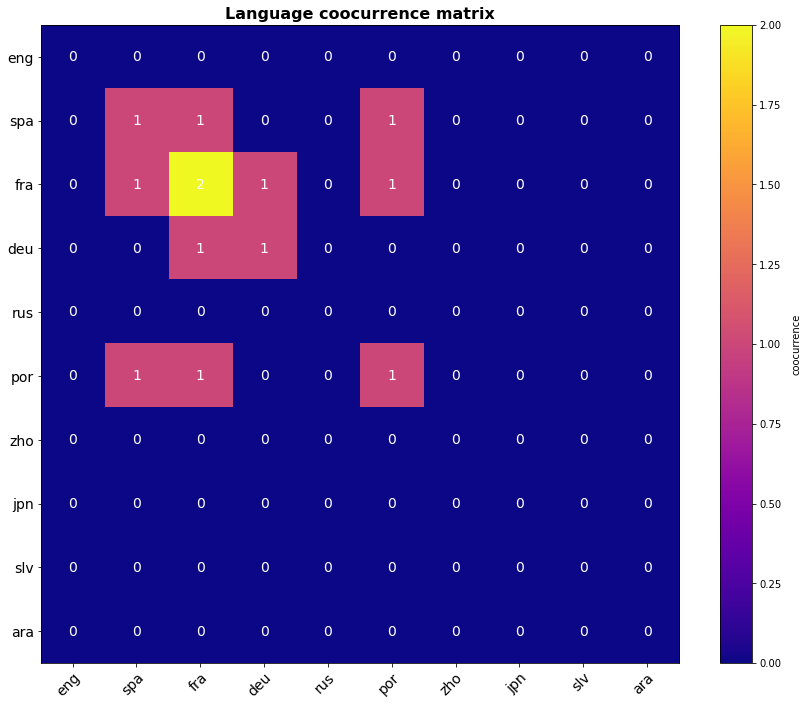

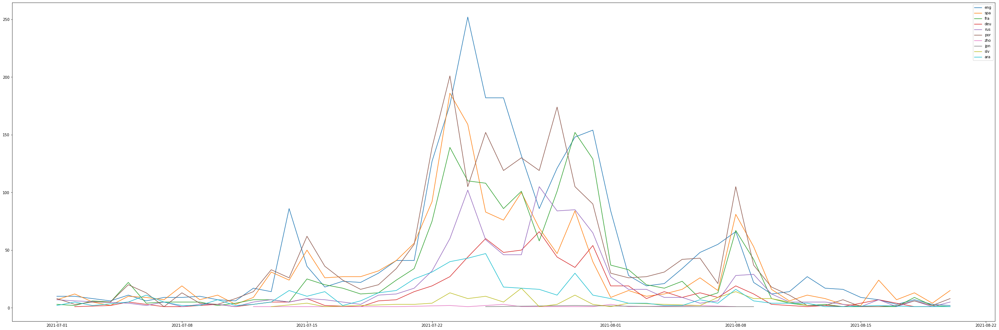

olympic_games, japan, table_tennis


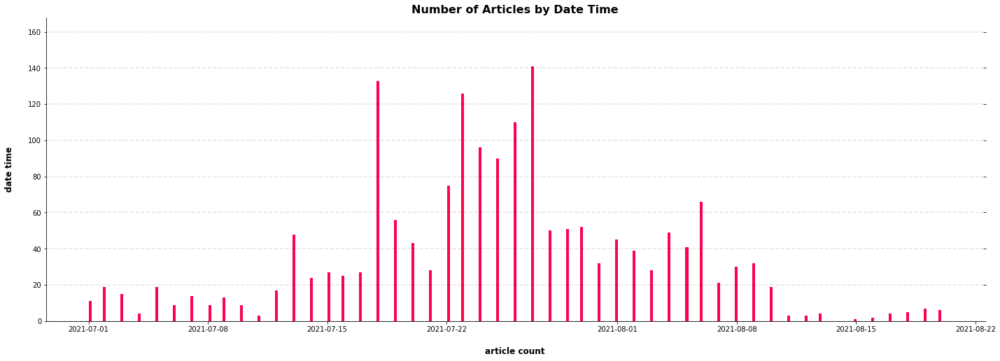

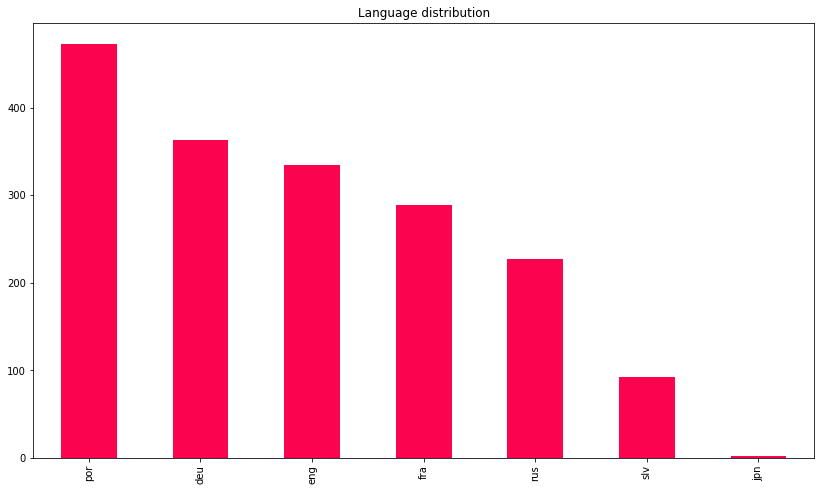

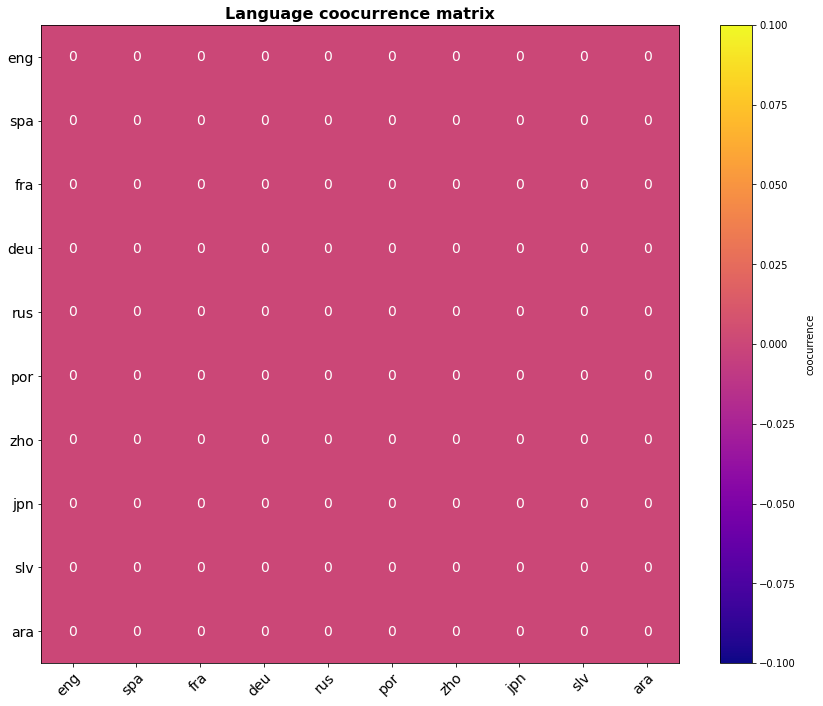

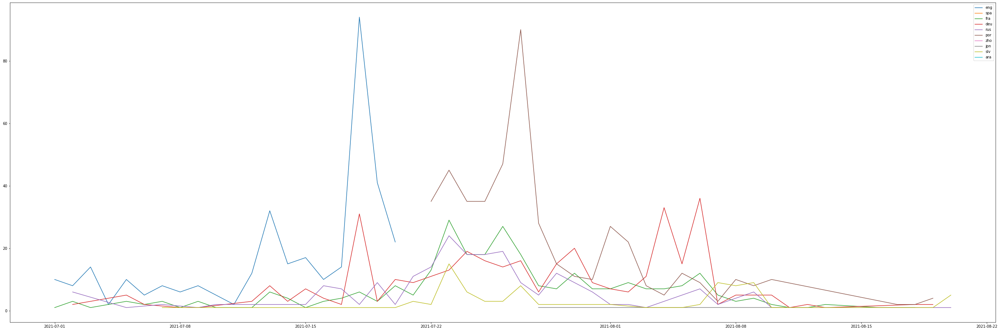

olympic_games, japan, swimming


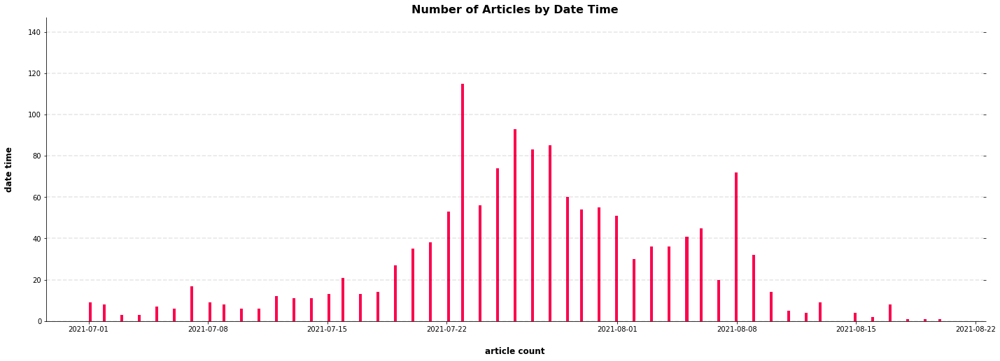

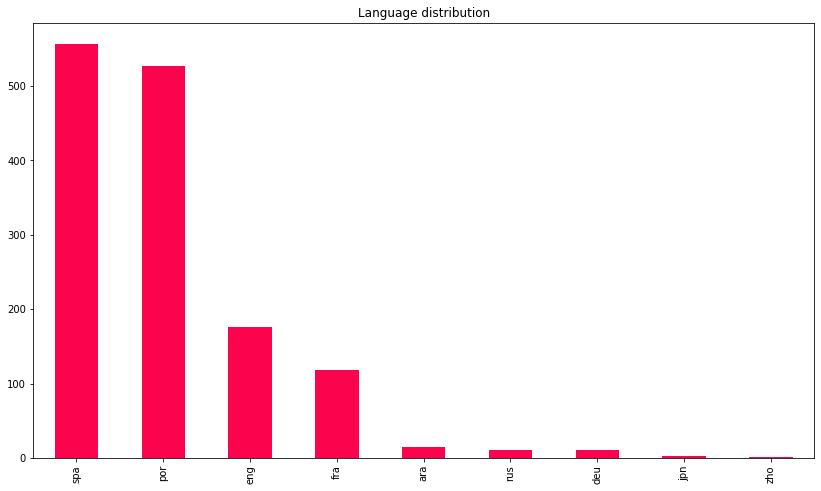

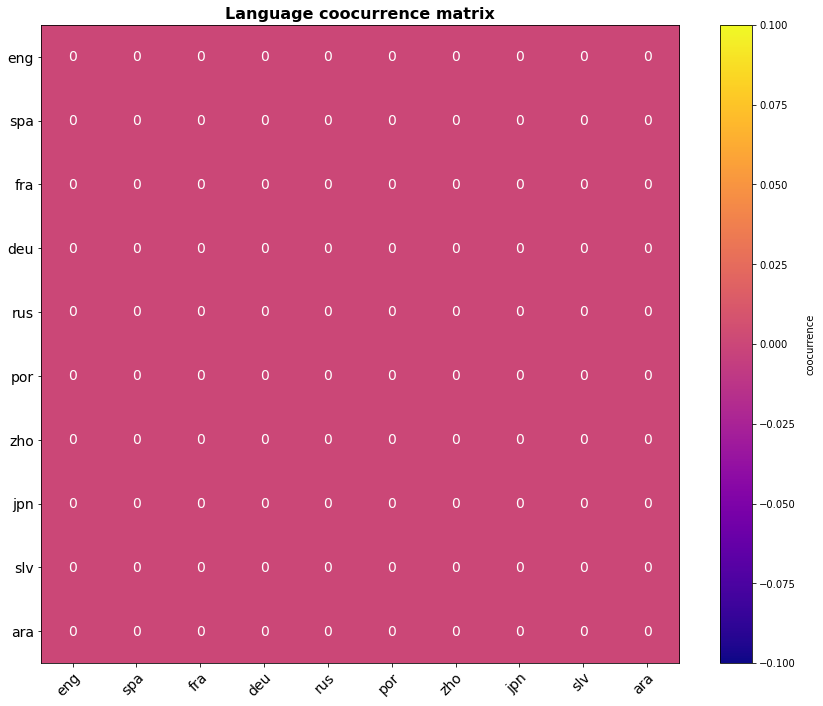

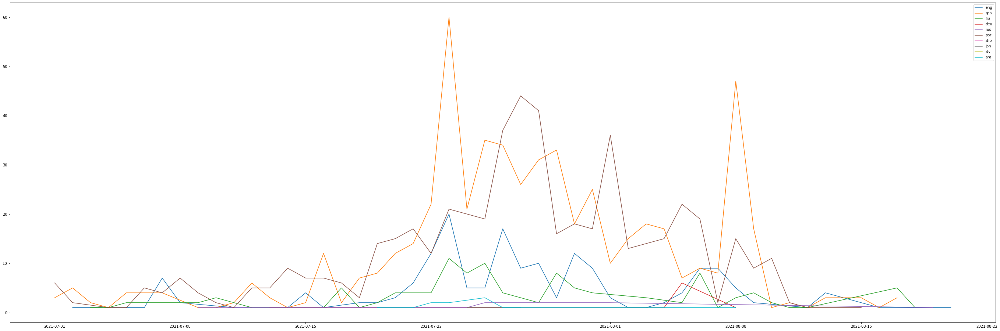

olympic_games, japan, rowing


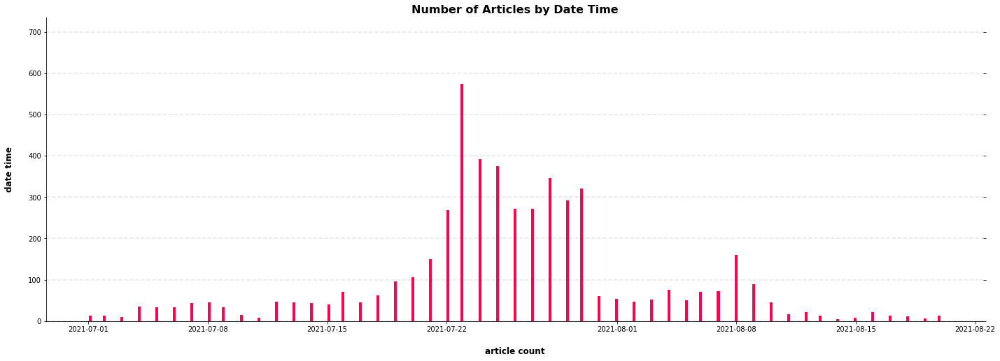

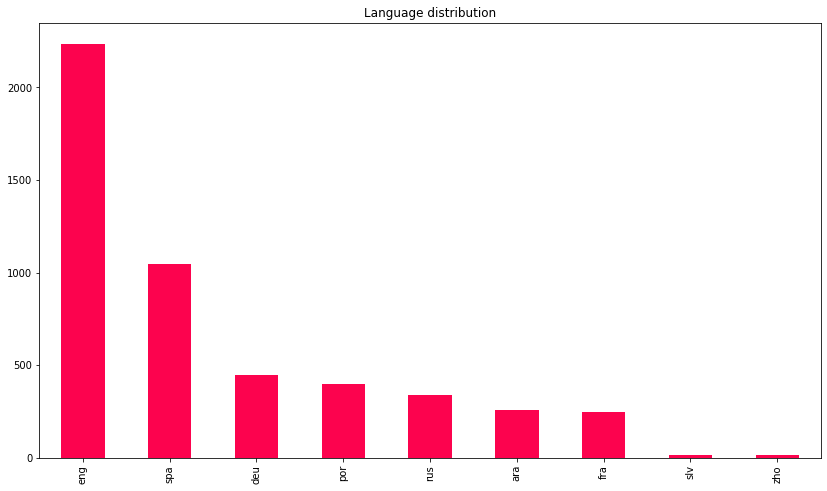

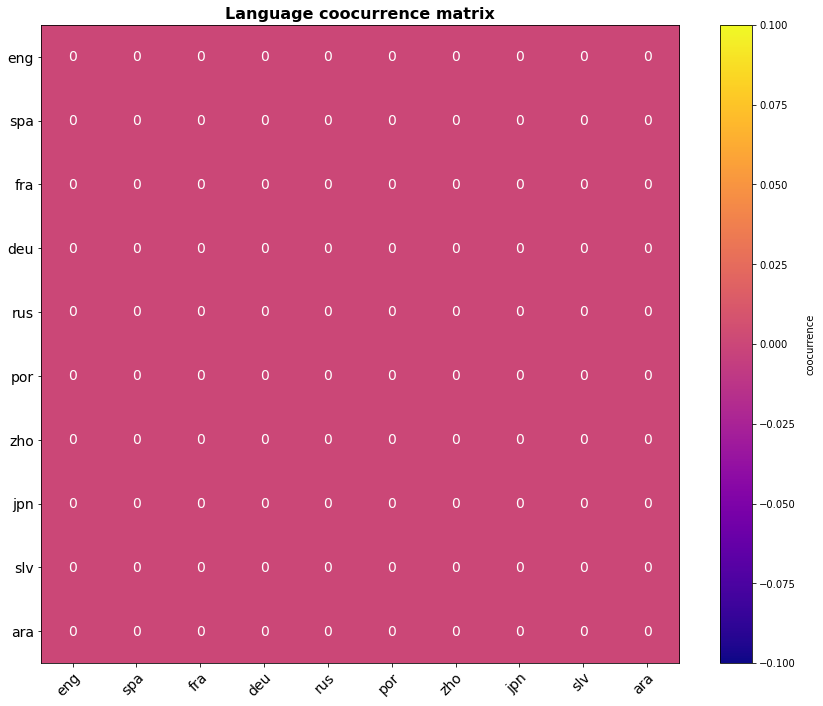

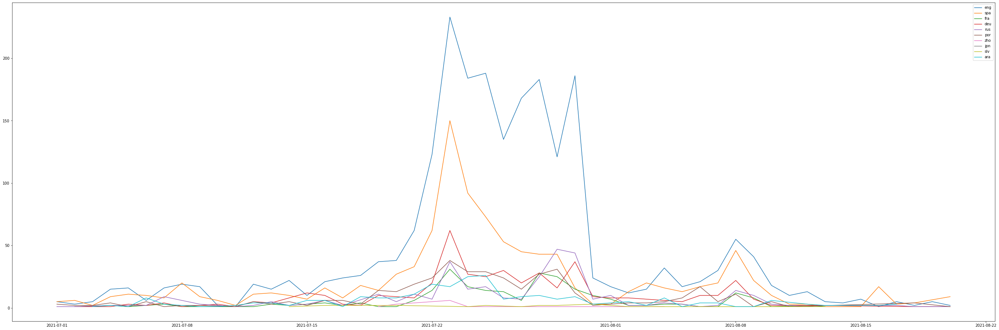

olympic_games, japan, skateboarding


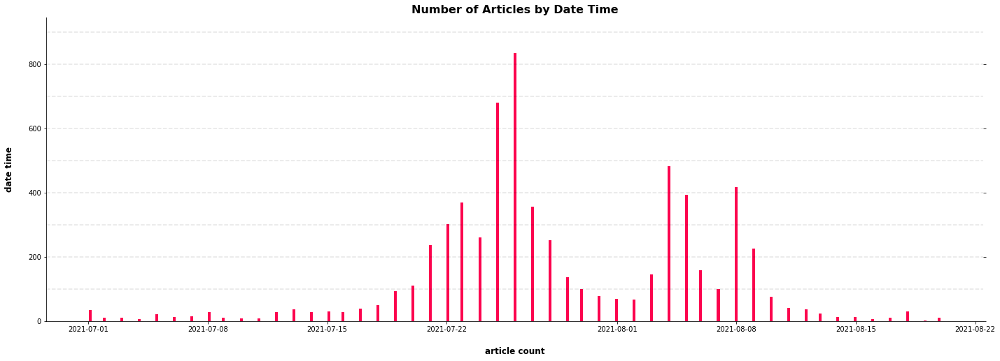

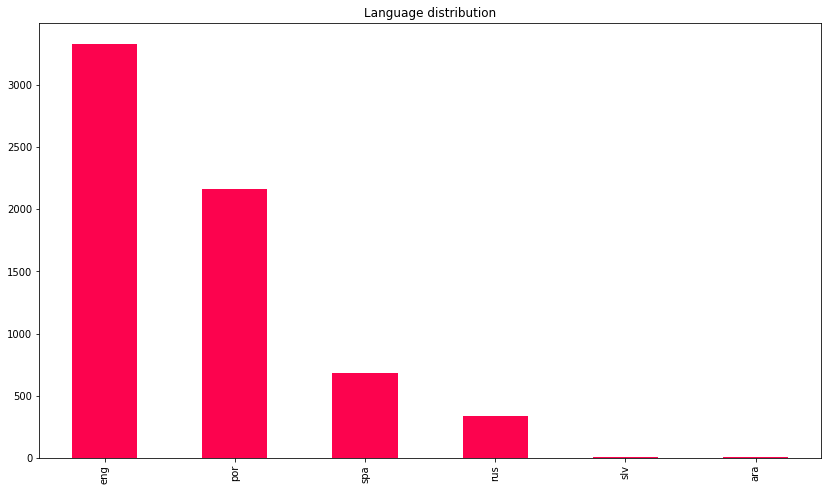

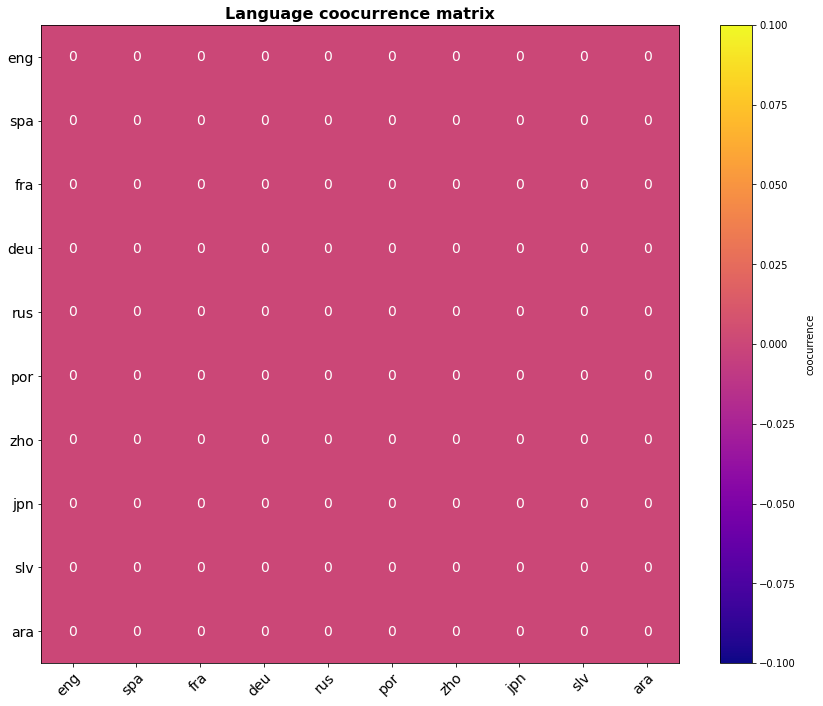

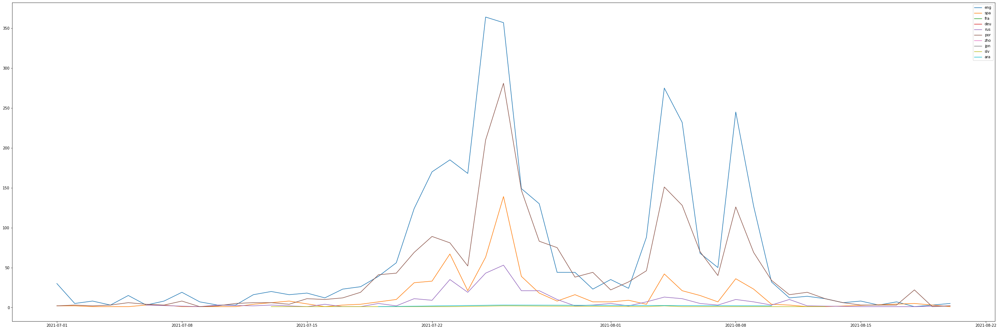

olympic_games, japan, sport_climbing


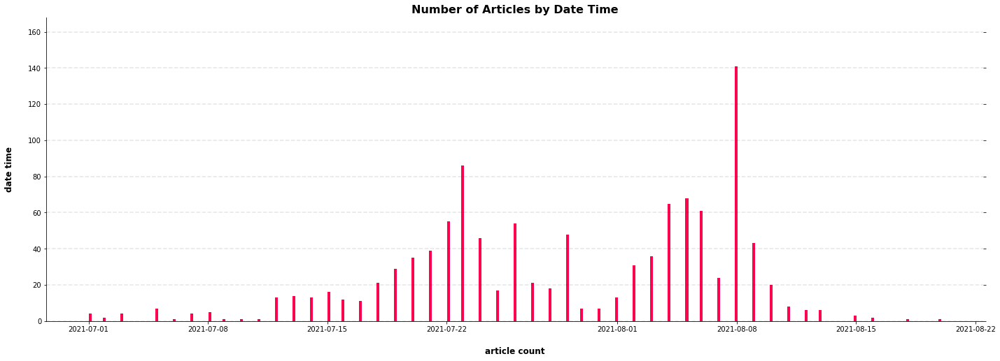

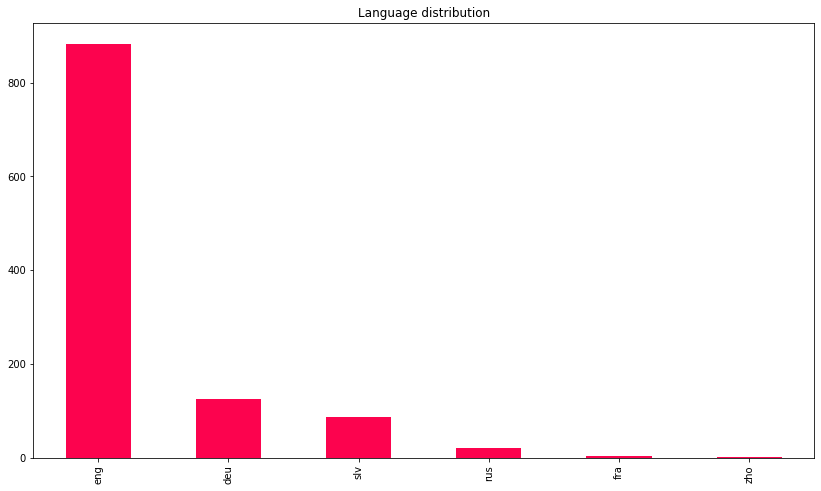

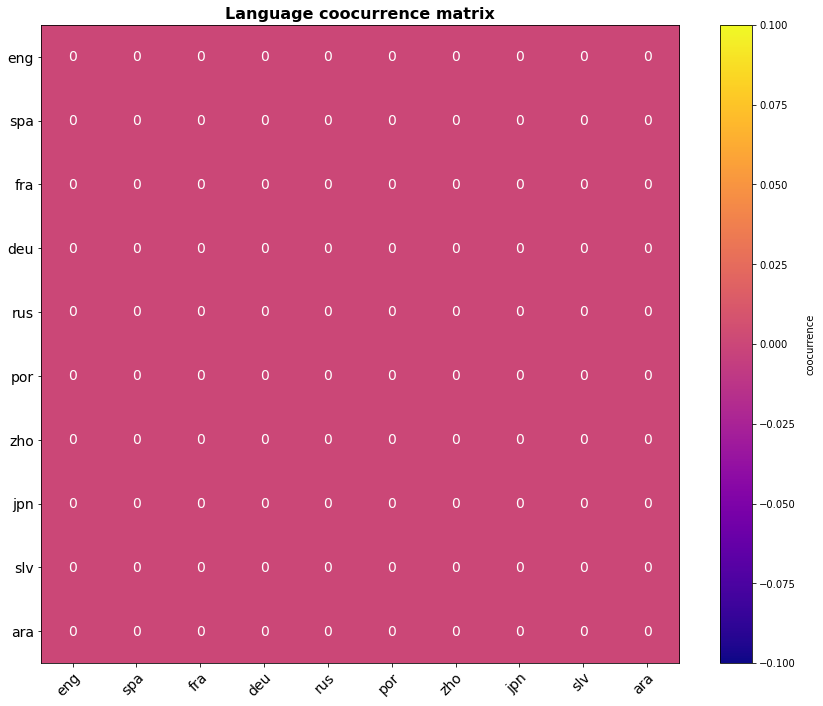

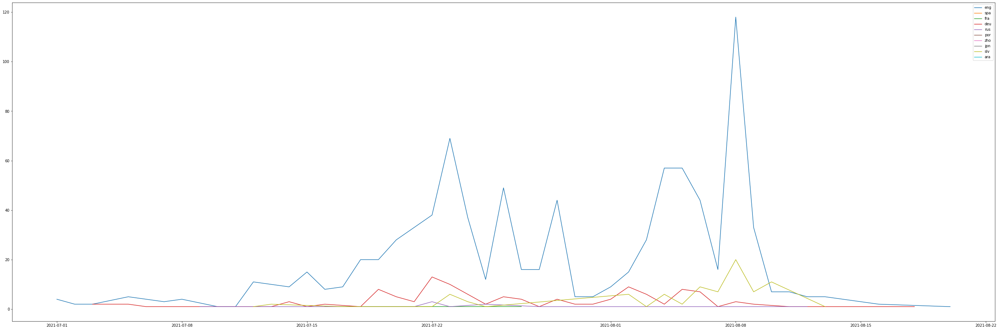

paralympic_games, japan, basketball


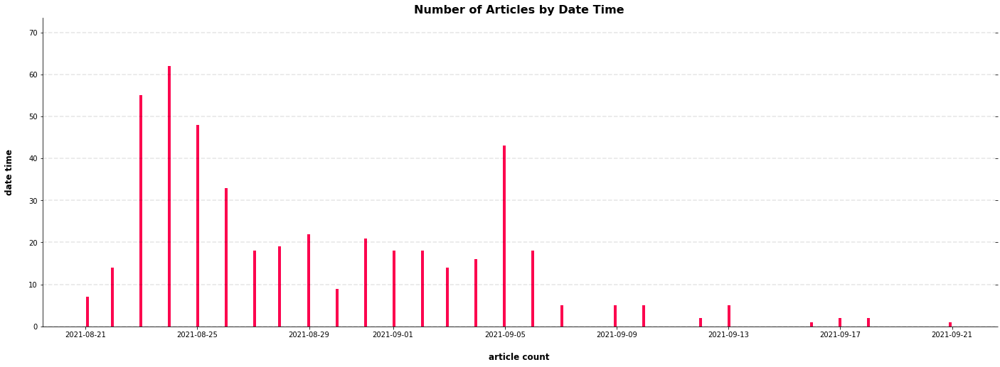

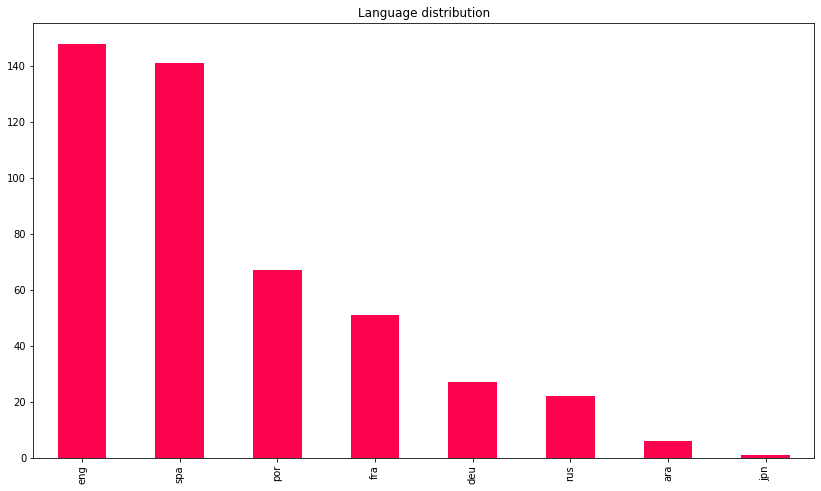

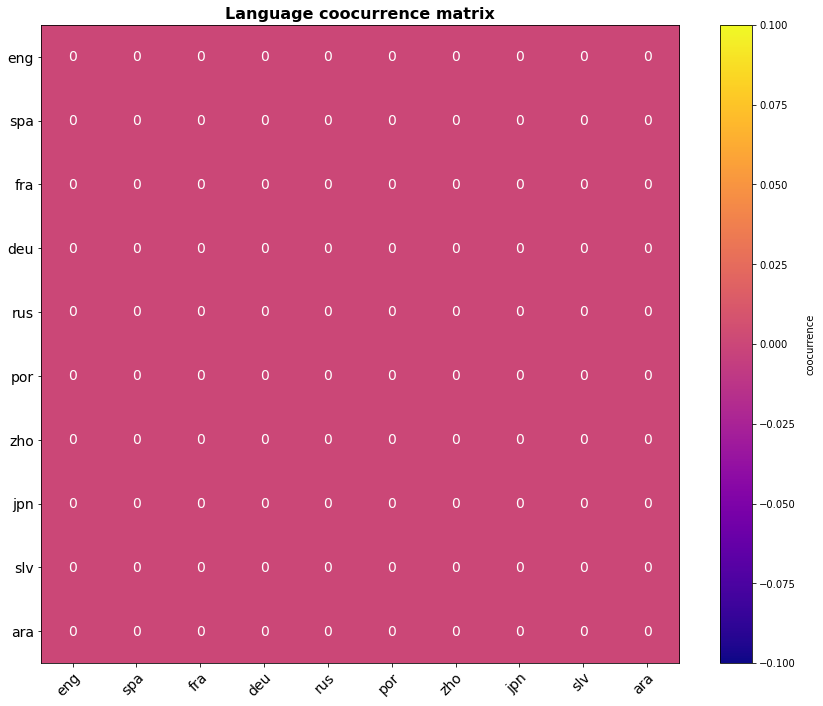

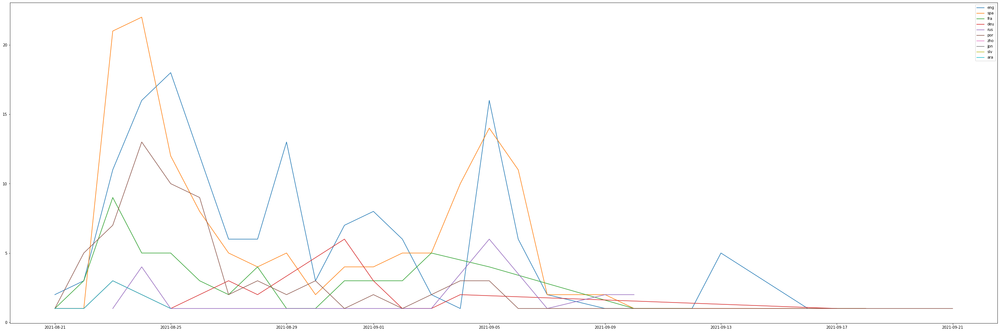

paralympic_games, japan, table_tennis


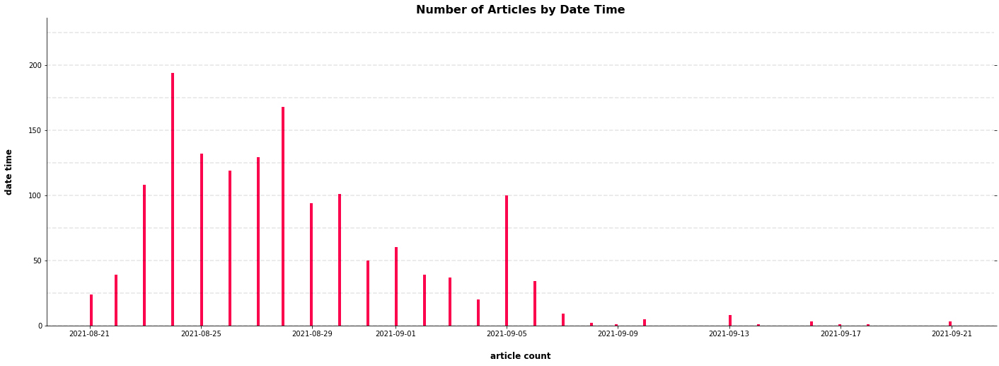

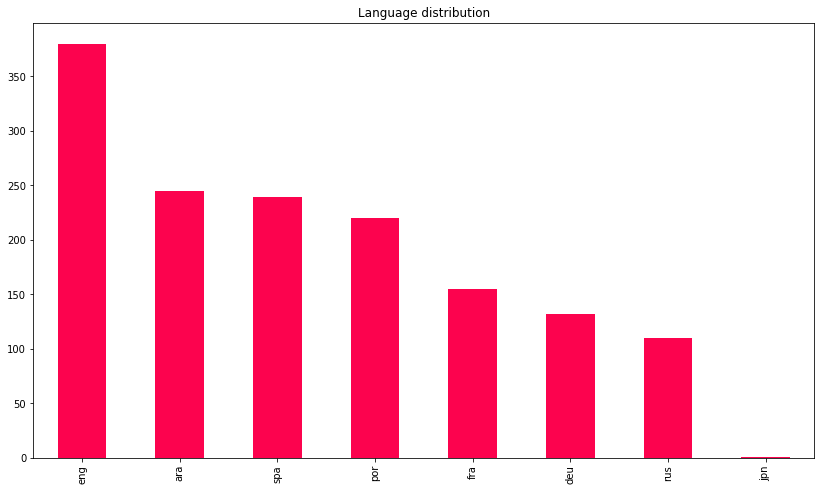

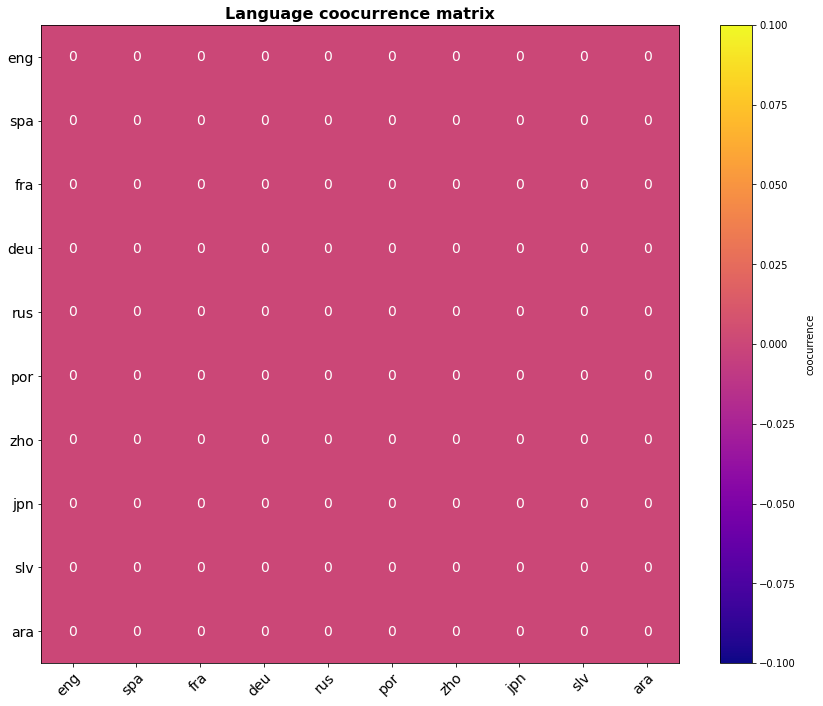

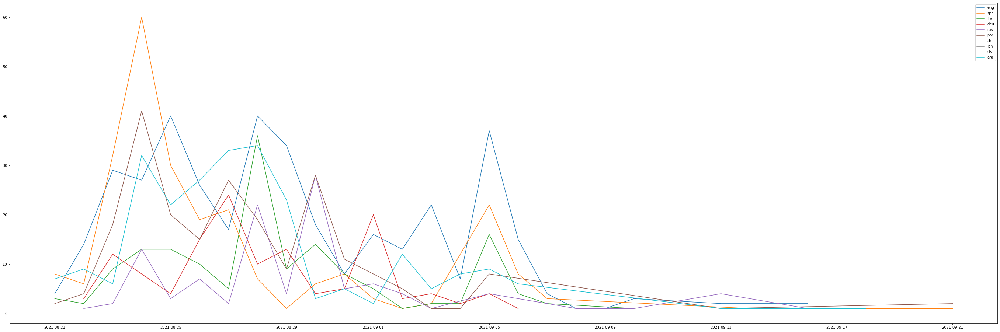

paralympic_games, japan, judo


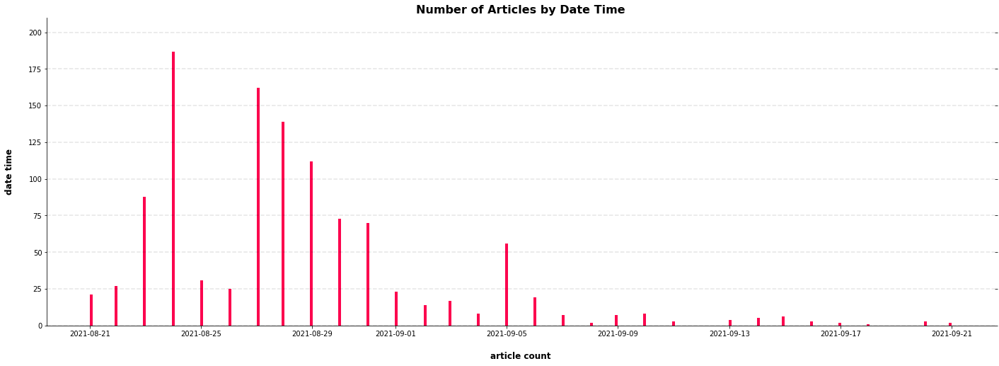

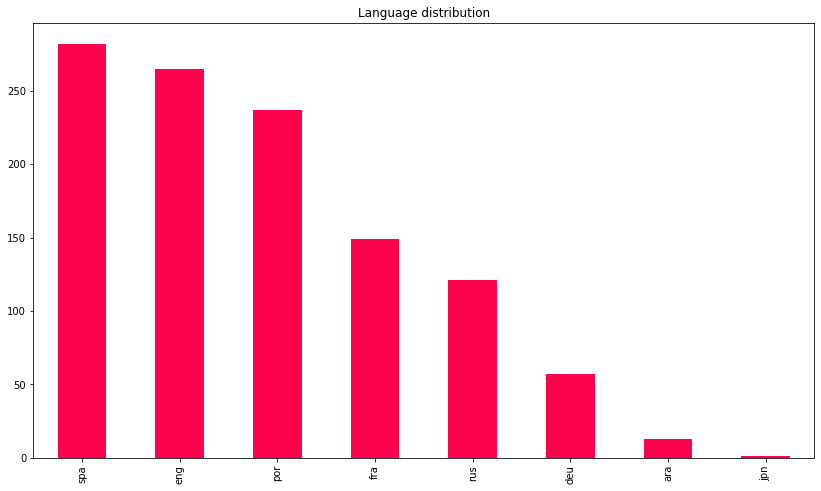

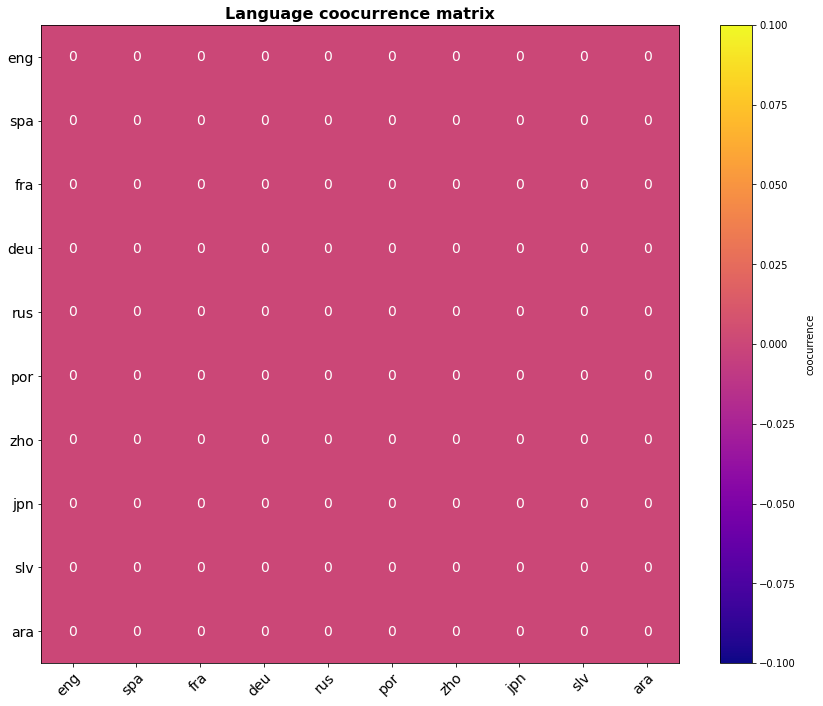

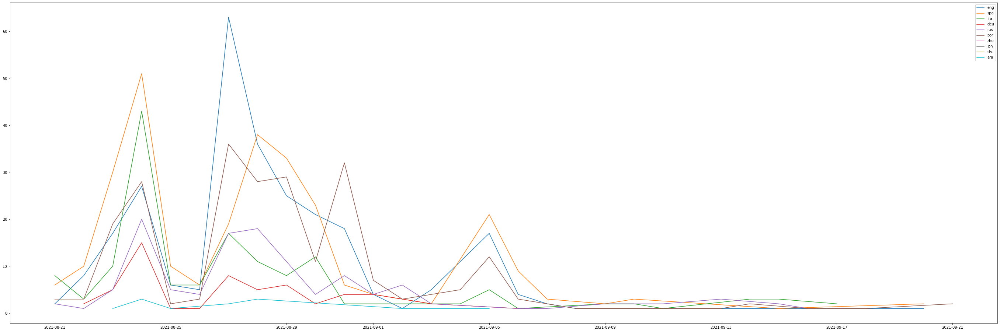

paralympic_games, japan, swimming


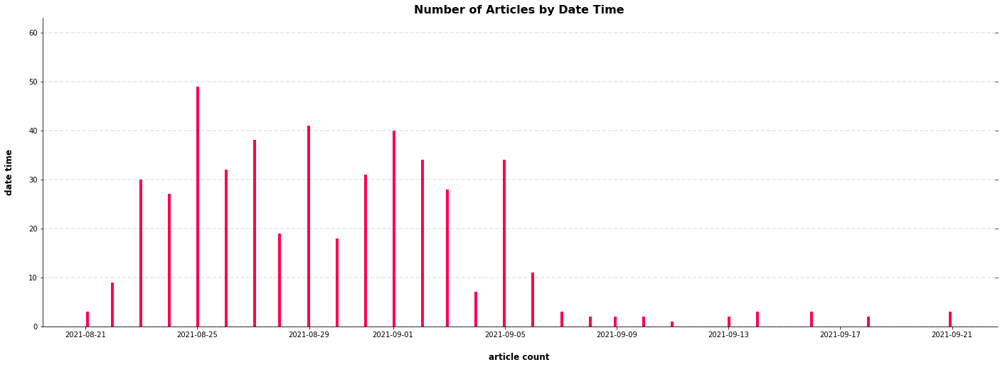

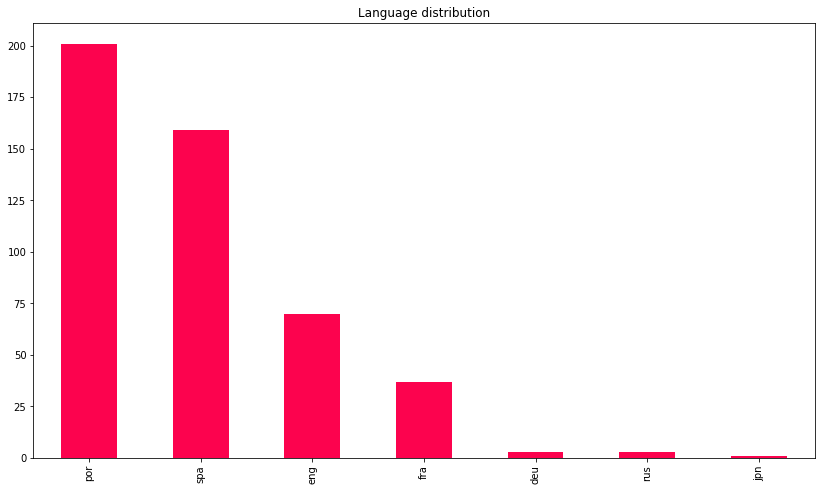

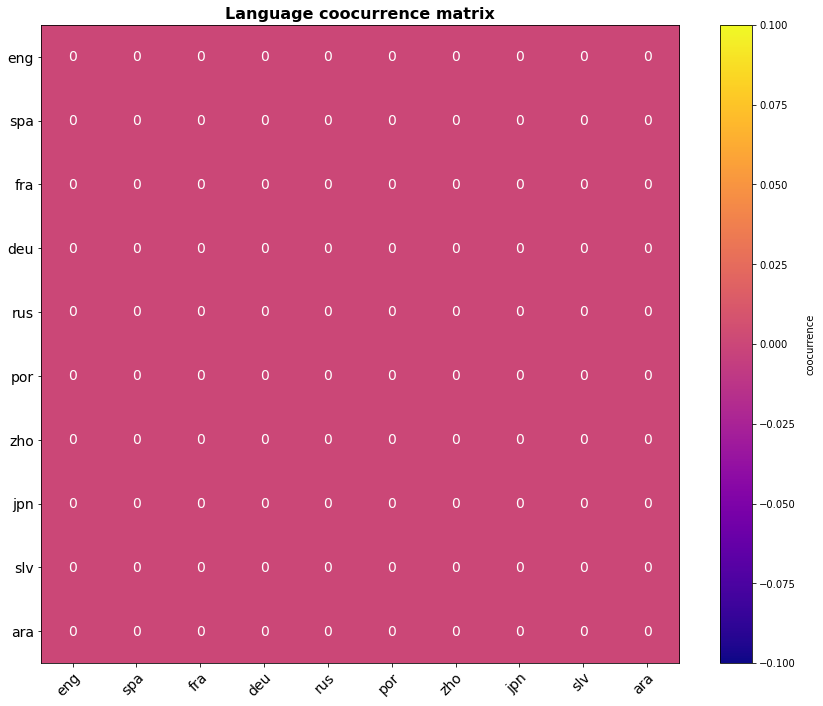

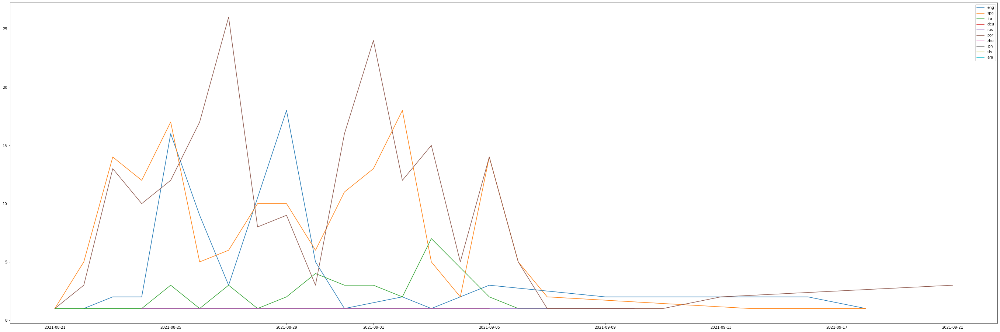

ever_given, suez_canal


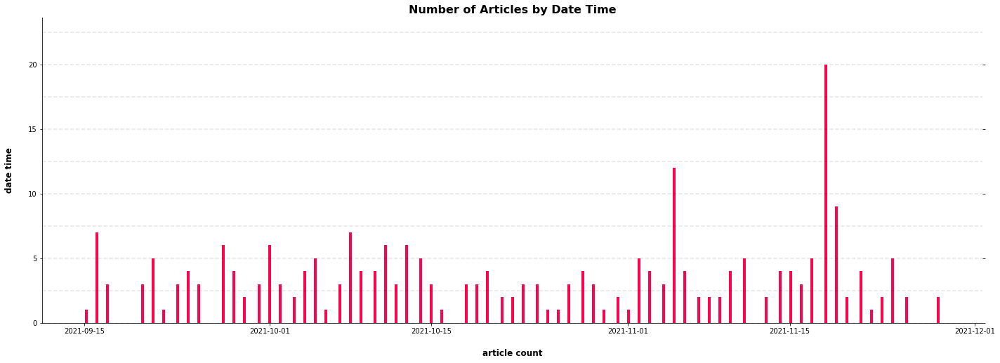

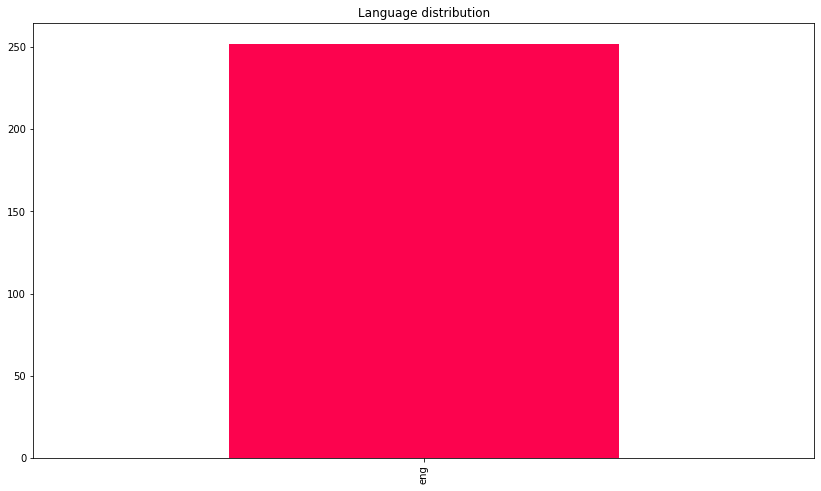

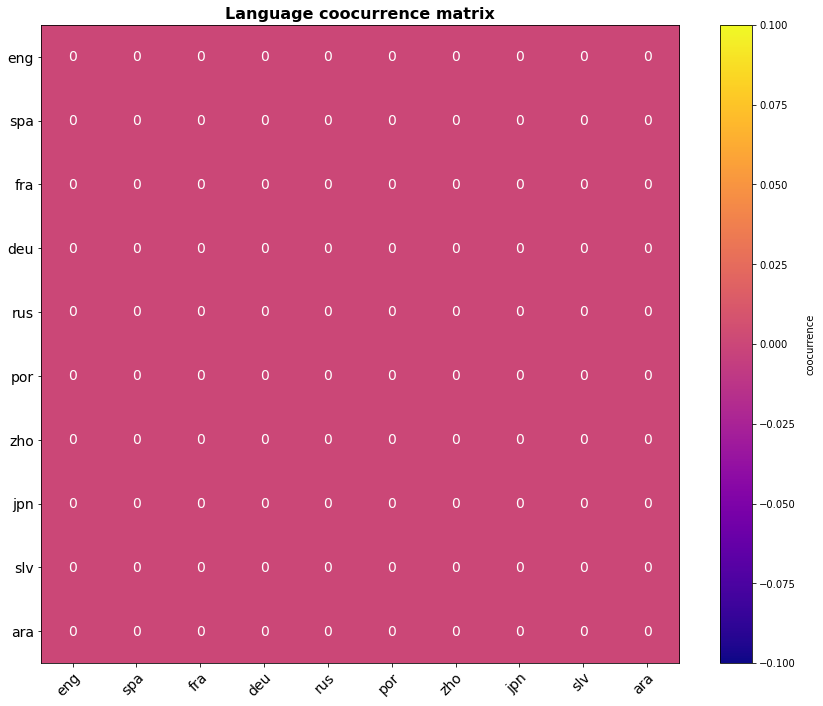

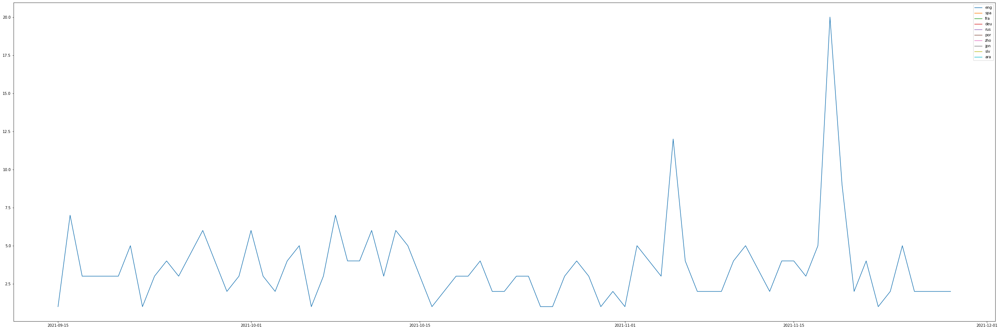

global_chip_shortage


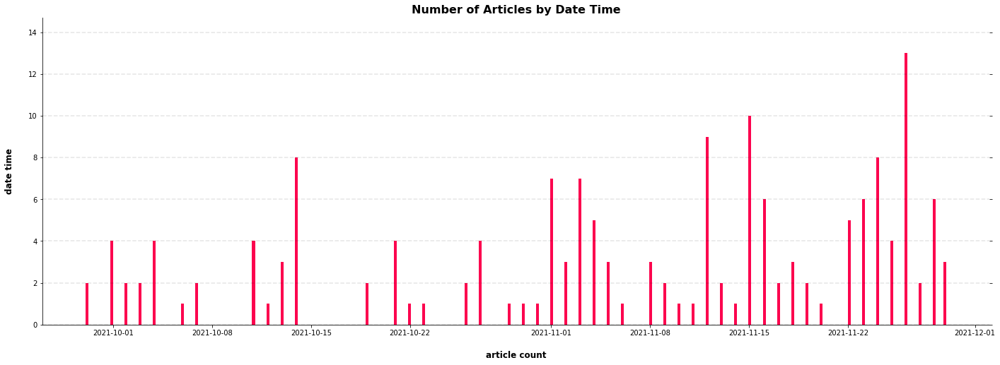

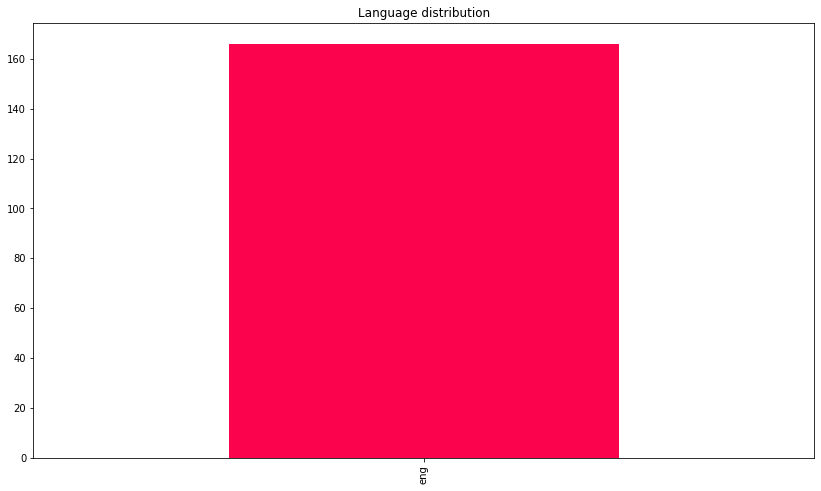

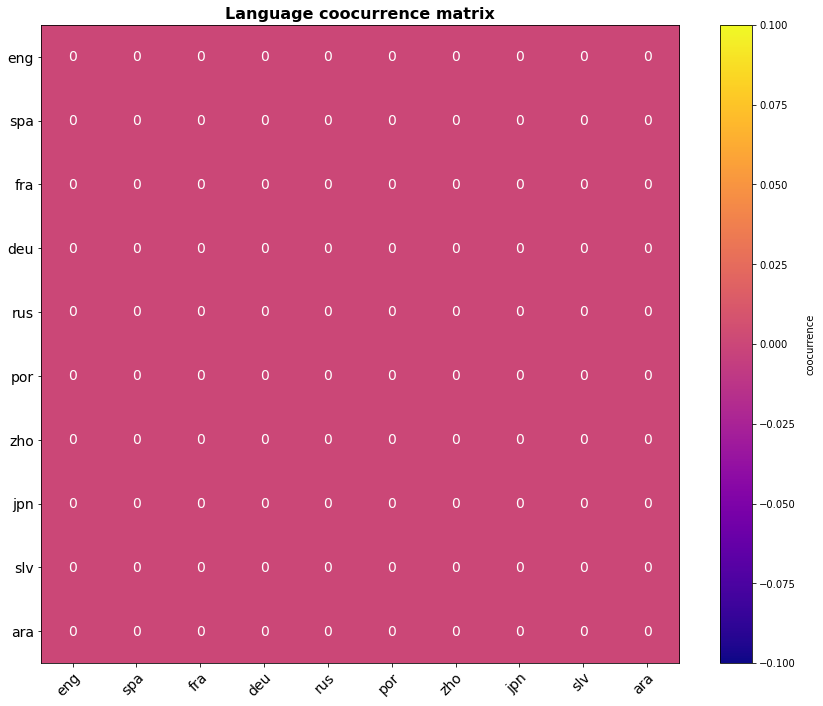

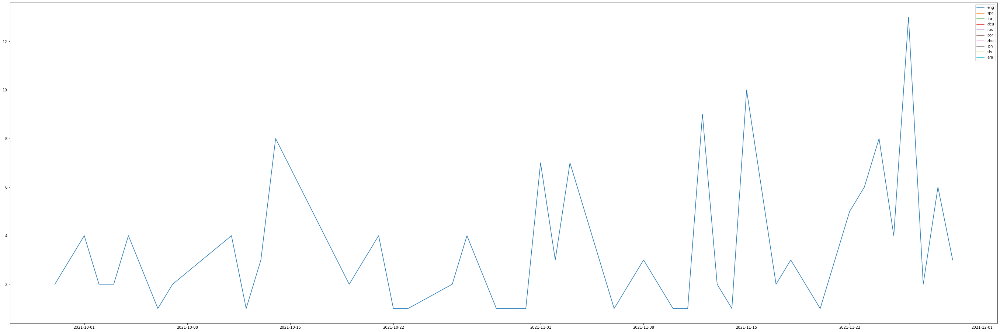

pandora_papers


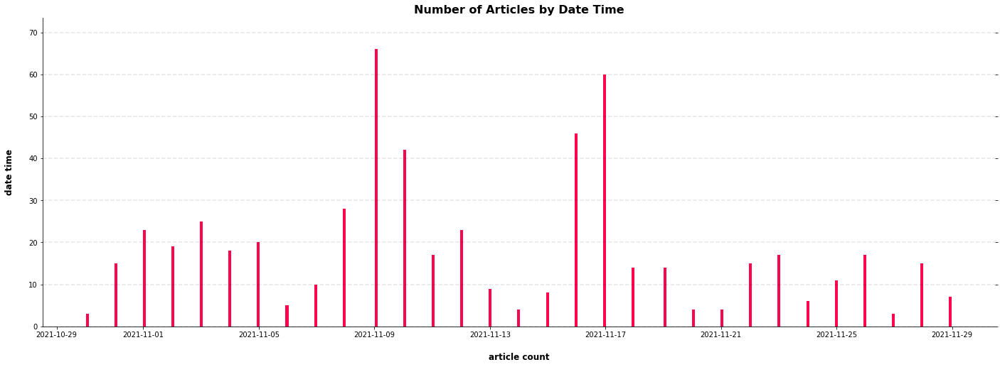

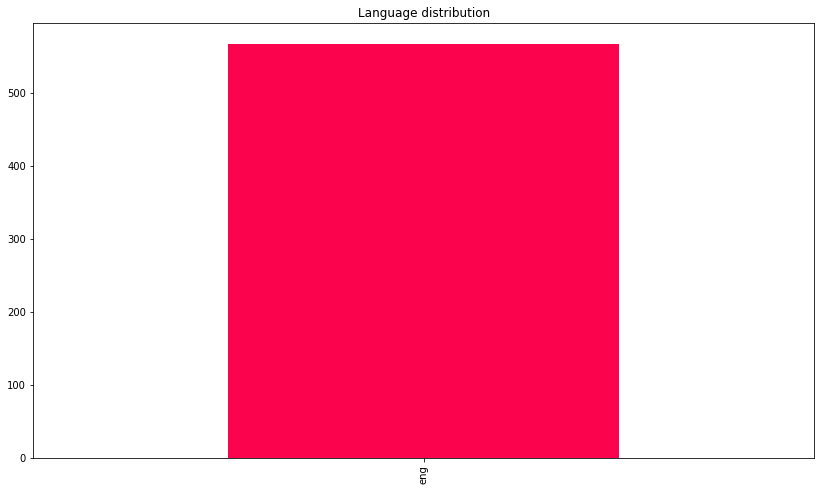

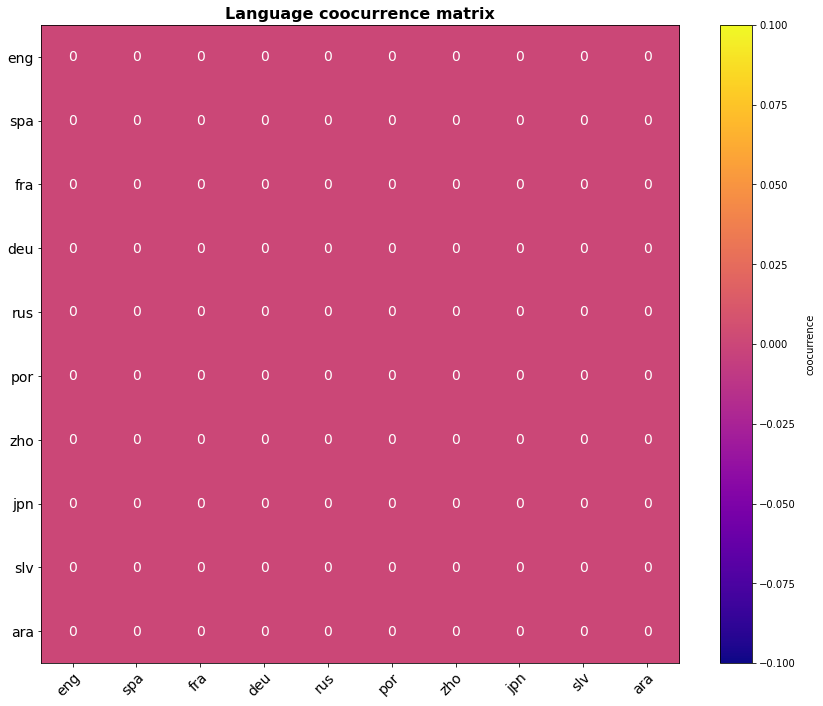

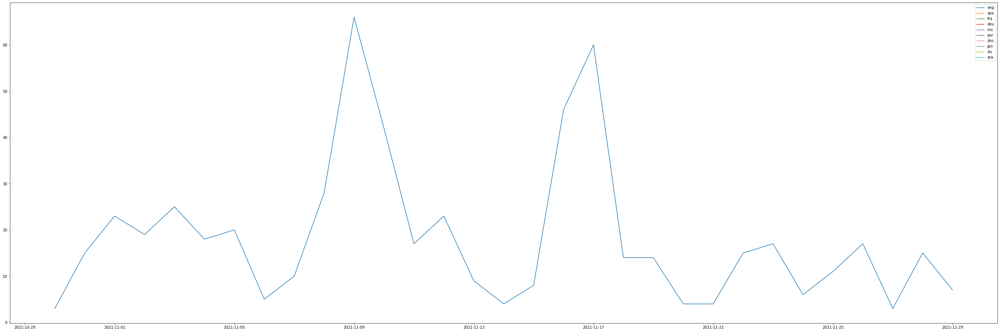

In [137]:
for concept_list in unique_concept_list:
    concept_df = mod_df .loc[mod_df['concepts'] == concept_list]
    print(concept_list)
    hist_plot(data_frame=concept_df)
    bar_plot(data_frame=concept_df)
    heatmap(matrix=lang_coocurrence_mx(data_frame=concept_df, relative=False))
    lang_line_chart(data_frame=concept_df)
    #duplicates(data_frame=concept_df)

In [47]:
data_frame_stacked = date_frame_wstr_concepts[['date', 'concepts']]
data_frame_stacked

,date,concepts
0,2020-01-01,"basketball, nba"
1,2020-01-01,"basketball, nba"
2,2020-01-01,"hong_kong, demonstration"
3,2020-01-01,"basketball, nba"
4,2020-01-01,"basketball, nba"
...,...,...
1750320,2021-11-29,"association_football, premier_league"
1750321,2021-11-29,"association_football, la_liga"
1750322,2021-11-29,"association_football, premier_league"
1750323,2021-11-29,me_too_movement


In [48]:
concepts_count_df = data_frame_stacked.groupby(["date", "concepts"]).size().reset_index(name="count")

Random list of 48 colors in python

In [ ]:
a=['aqua', 'blue', 'blueviolet', 'cadetblue', 'teal', 'crimson', 'cyan', 'darkgreen',
     'darkorchid', 'darkslateblue', 'darkviolet', 'deeppink', 'deepskyblue', 'firebrick', 'gold', 'forestgreen',
     'green', 'indigo', 'hotpink', 'lawngreen', 'lightblue', 'darkkhaki', 'limegreen', 'magenta',
     'silver', 'mediumspringgreen', 'navy', 'orchid', 'tan', 'palegreen', 'thistle', 'powderblue',
     'red', 'royalblue', 'olivedrab', 'mediumvioletred', 'sienna', 'slateblue', 'skyblue', 'springgreen',
     'turquoise', 'mediumturquoise', 'mediumseagreen', 'mediumorchid', 'wheat', 'yellow', 'antiquewhite', 'lightseagreen']

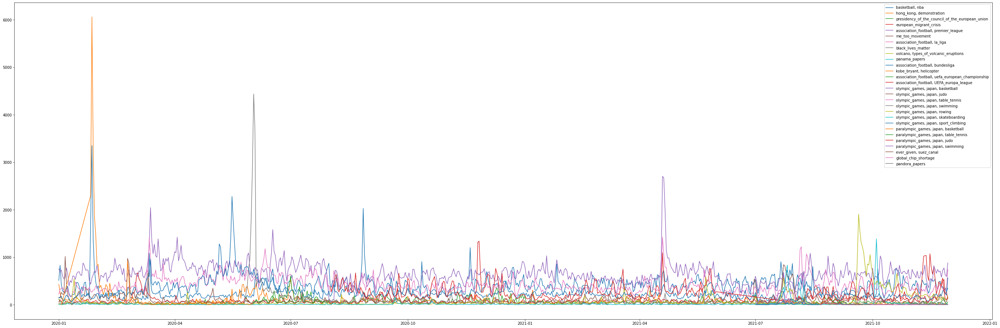

In [49]:
plt.figure(figsize=(48,16))
for concept_list in unique_concept_list:
    concept_df = concepts_count_df .loc[concepts_count_df['concepts'] == concept_list]
    plt.plot(concept_df['date'], concept_df['count'], label = concept_list)
    plt.legend(loc='upper right')
